<a id="1"></a> 
# <p style="background-color: #3498db; padding: 20px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2.5em; text-align: center; font-weight: 600;">Introduction</p> 

The purpose of this notebook is a basic exploration of the TANK_BEHAVIOR dataset which is the merge of 4 datasets provided by PGS that we selected briefly for this section.
Here are the goals of this exploration:
* Gain a basic understanding of the data set
* Look at how the data set might be used to predict bulk behavior anomalies 
* Walk through some fundemental concepts of building machine learning models

Throughout we'll do some work by hand that could be done in more effective ways using delivered functionality within sci-kit. The intent here is to be more deliberate about the process of understanding what we're doing and why. We will look at how to approach some of these problems using the built-in toools in a later notebook.

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Dataset</p>

 ### <p style="background-color: #3498db; padding: 8px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.5em; text-align: center; font-weight: 600;">Feature Description </p>

- BULK_MOVEMENT_ID: Unique identifier for a bulk movement.
- BULK_PRODUCT_ID: Unique identifier for a bulk product.	
- TERMINAL_PRODUCT_NUMBER: Terminal product number for the product in the tank 
- CONTAINER_CODE: A unique identifier for the container, used to track and identify it within the system.	
- FIGURES_TYPE: Type of figures (e.g., "Actual", "Calculated").	
- GROSS_QUANTITY: Gross quantity of the terminal product delivered 
- NET_QUANTITY: Net quantity of the terminal product delivered 	
- DENSITY: Density of the terminal product delivered 
- TEMPERATURE: Temperature of a container.
- WEIGHT: Weight in air of the terminal product delivered 
- LAST_USER_NAME	
- LAST_MODIFIED_x	
- START_DATE	
- END_DATE	
- INVENTORY_QUANTITY_TYPE	
- WEIGHT_IN_VAC: Weight in vacuum of the terminal product delivered 
- GROSS_FRAC_QUANTITY	
- NET_FRAC_QUANTITY	
- FRAC_WEIGHT: Fractional portion of the declared weight in air 
- FRAC_WEIGHT_IN_VAC: Fractional portion of the declared weight in vacuum
- DIRECTION	
- DECLARED_GROSS_QUANTITY	
- DECLARED_GROSS_FRAC_QUANTITY	
- DECLARED_NET_QUANTITY	
- DECLARED_NET_FRAC_QUANTITY	
- DECLARED_WEIGHT	
- DECLARED_FRAC_WEIGHT	
- DECLARED_WEIGHT_IN_VAC	
- MEASURED_QUANTITY_TYPE	
- DECLARED_FRAC_WEIGHT_IN_VAC	
- FOLIO_NUMBER: represents one business day and is used to group that business day's orders and bulk movements.
- TO_SUPPLIER_NUMBER: A company that owns or sells products at a terminal. A supplier may also be called a shipper, exchanger, or through putter, depending on the role the supplier plays in a transaction.
- TYPE: Bulk movement types
- MOVEMENT_NUMBER: A unique number assigned to each movement of products.
- STATUS: The status of the movement	
- STATUS_DATE: The date the movement status was last updated. 
- MOVEMENT_DATE: The date the movement occurred. 	
- HOST_PROCESSED	
- AIC_STATUS	
- FLAG_APPLY_SUPPLIER_INV	
- PREV_BULK_MOVEMENT_ID	
- OWNER_ID	
- CONTAINER_TYPE: The type of container, such as a tank or a bulk.
- COMPARTMENT_NUMBER: The number of the compartment where the container is stored.
- CAPACITY: The capacity of the container, measured in units such as gallons or pounds.	

<a id="1"></a> 
# <p style="background-color: #3498db; padding: 20px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2.5em; text-align: center; font-weight: 600;">Importing libraries</p> 

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from matplotlib.ticker import FuncFormatter
from sklearn.feature_selection import SelectFromModel, VarianceThreshold

<a id="1"></a> 
# <p style="background-color: #3498db; padding: 20px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2.5em; text-align: center; font-weight: 600;">Reading and understanding the dataset</p> 

We are using 4 datasets in this tank behavior exploration: BULK_PRODUCT, Bulk_mouvement, COMPARTMENT and CONTAINER.

First Let's load our BULK_PRODUCT and Bulk_mouvement datasets.

In [37]:
bulk_product = pd.read_excel("BULK_PRODUCT.xlsx")

bulk_mouvement = pd.read_excel("Bulk_movement.xlsx")

C:\Users\hamdi\anaconda3\Lib\site-packages\openpyxl\worksheet\header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored
  warn("""Cannot parse header or footer so it will be ignored""")
C:\Users\hamdi\anaconda3\Lib\site-packages\openpyxl\worksheet\header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored
  warn("""Cannot parse header or footer so it will be ignored""")


We drop the columns that have more than 90% percentage of null values.

In [38]:
to_drop = []

for col in bulk_product.columns:
    if bulk_product[col].isnull().sum() / bulk_product.shape[0] > .9:
        to_drop.append(col)

for col in bulk_product.columns:
    if bulk_product[col].nunique() == 1:
        to_drop.append(col)
bulk_product.drop(to_drop, axis=1,inplace=True)


to_drop = []

for col in bulk_mouvement.columns:
    if bulk_mouvement[col].isnull().sum() / bulk_mouvement.shape[0] > .9:
        to_drop.append(col)

for col in bulk_mouvement.columns:
    if bulk_mouvement[col].nunique() == 1:
        to_drop.append(col)
bulk_mouvement.drop(to_drop, axis=1,inplace=True)

Then, we merge them based on BULK_MOUVEMENT_ID.

In [39]:
df = bulk_product.merge(bulk_mouvement, on=["BULK_MOVEMENT_ID"])

Secondly, we load the COMPARTMENT and CONTAINER datasets.

In [40]:
compartment = pd.read_excel("COMPARTMENT.xlsx")

container = pd.read_excel("CONTAINER.xlsx")

C:\Users\hamdi\anaconda3\Lib\site-packages\openpyxl\worksheet\header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored
  warn("""Cannot parse header or footer so it will be ignored""")
C:\Users\hamdi\anaconda3\Lib\site-packages\openpyxl\worksheet\header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored
  warn("""Cannot parse header or footer so it will be ignored""")


Like we did before, we drop the columns that have more than 90% percentage of null values or having one unique value.

In [41]:
to_drop = []

for col in compartment.columns:
    if compartment[col].isnull().sum() / compartment.shape[0] > .9:
        to_drop.append(col)

for col in compartment.columns:
    if compartment[col].nunique() == 1:
        to_drop.append(col)
compartment.drop(to_drop, axis=1,inplace=True)


to_drop = []

for col in container.columns:
    if col != 'NAME' and container[col].isnull().sum() / container.shape[0] > .9:
        to_drop.append(col)

for col in container.columns:
    if container[col].nunique() == 1:
        to_drop.append(col)
container.drop(to_drop, axis=1,inplace=True)

We merge the compartment and container datasets.

In [42]:
df2 = compartment.merge(container, on= ["CONTAINER_CODE"])

We drop CONTAINER_TYPE and OWNER_ID duplicates.

In [43]:
df2 = df2.drop(['CONTAINER_TYPE_y','OWNER_ID_y'],axis=1)

Finally, we merge the df and df2 datasets based on 'CONTAINER_CODE' to get one final dataset which we gonna work with.

In [44]:
tb = df.merge(df2, on= ["CONTAINER_CODE"])

We drop LAST_MODIFIED duplicate.

In [45]:
tb = tb.drop('LAST_MODIFIED_y', axis=1)

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Data at first sight</p>

Let's look at first 5 records of our data.

In [46]:
tb.head(10)

,BULK_MOVEMENT_ID,BULK_PRODUCT_ID,TERMINAL_PRODUCT_NUMBER,CONTAINER_CODE,FIGURES_TYPE,GROSS_QUANTITY,NET_QUANTITY,DENSITY,TEMPERATURE,WEIGHT,...,MOVEMENT_DATE,HOST_PROCESSED,AIC_STATUS,FLAG_APPLY_SUPPLIER_INV,PREV_BULK_MOVEMENT_ID,OWNER_ID_x,COMPARTMENT_NUMBER,CONTAINER_TYPE_x,CAPACITY,NAME
0,3321,3319,4,TK-202,1,0,0,736,15.0,0,...,2021-09-23 16:25:35,2021-09-23 16:27:24.720,2,0,3321,0,1,1,0,MOGAS
1,2085042,2085041,4,TK-202,4,10027001,10027001,742,15.0,7429246,...,2022-12-30 15:02:07,2022-12-30 15:02:48.947,1,2,2085042,0,1,1,0,MOGAS
2,3060094,3060093,4,TK-202,4,10875473,10875473,743,15.0,8068759,...,2023-07-13 12:04:26,2023-07-13 12:08:06.430,1,2,3060094,0,1,1,0,MOGAS
3,3321,3320,7,TK-103,1,0,0,826,15.0,0,...,2021-09-23 16:25:35,2021-09-23 16:27:24.720,2,0,3321,0,1,1,0,GASOIL
4,17721,17723,10,TK-103,1,10000,10000,800,15.0,7989,...,2021-09-27 09:11:42,2021-09-27 09:14:33.433,2,0,17721,0,1,1,0,GASOIL
5,1223066,1223065,7,TK-103,4,122215384,122215384,883,15.0,107781288,...,2022-06-28 17:14:16,2022-06-28 17:14:56.280,1,2,1223066,0,1,1,0,GASOIL
6,1258133,1258132,7,TK-103,4,30000,30000,824,15.0,24686,...,2022-07-05 10:13:50,2022-07-05 10:15:36.397,1,2,1258133,0,1,1,0,GASOIL
7,1289748,1289747,7,TK-103,4,900000,897633,824,18.0,738651,...,2022-07-13 16:44:02,2022-07-13 16:45:34.620,1,2,1289748,0,1,1,0,GASOIL
8,1315374,1315373,7,TK-103,1,2000000,1994760,826,18.0,1645447,...,2022-07-19 16:08:29,2022-07-19 16:09:29.950,1,2,1315374,0,1,1,0,GASOIL
9,1332129,1332128,7,TK-103,4,1215066,1215066,823,15.0,998649,...,2022-07-22 10:34:50,2022-07-22 10:35:45.187,1,2,1332129,0,1,1,0,GASOIL


Let's look at last 5 records of our data.

In [47]:
tb.tail()

,BULK_MOVEMENT_ID,BULK_PRODUCT_ID,TERMINAL_PRODUCT_NUMBER,CONTAINER_CODE,FIGURES_TYPE,GROSS_QUANTITY,NET_QUANTITY,DENSITY,TEMPERATURE,WEIGHT,...,MOVEMENT_DATE,HOST_PROCESSED,AIC_STATUS,FLAG_APPLY_SUPPLIER_INV,PREV_BULK_MOVEMENT_ID,OWNER_ID_x,COMPARTMENT_NUMBER,CONTAINER_TYPE_x,CAPACITY,NAME
758,2225560,2225559,7,TK-104,4,399356,399356,821,15.0,327428,...,2023-02-02 14:08:04,2023-02-02 14:08:41.340,1,2,2225560,0,1,1,0,GASOIL
759,2261278,2261277,7,TK-104,4,317415,317415,821,15.0,260245,...,2023-02-10 16:37:20,2023-02-10 16:43:32.110,1,2,2261278,0,1,1,0,GASOIL
760,2712149,2712148,7,TK-104,4,500000000,500000000,821,15.0,409945825,...,2023-05-12 04:01:26,2023-05-12 04:08:22.083,1,2,2712149,0,1,1,0,GASOIL
761,2816386,2816385,1,TK-306,4,0,0,9909,40.0,10000,...,2023-05-29 15:58:48,2023-05-29 16:01:09.967,2,0,2816386,0,1,1,0,FUEL OIL
762,2816412,2816411,1,TK-306,4,0,0,9909,43.0,10000,...,2023-05-29 16:01:15,2023-05-29 16:02:27.880,2,0,2816412,0,1,1,0,FUEL OIL


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">    
    <strong>📝 Data Information</strong> 
    <br>
    
We indeed see the following: <br>
- Cateogrical variables <br>
- Numerical variables <br>
- Datetime variables

It seems like folio number column values are integer type. Based on the data description, its values should be a datetim type. So we convert it.

In [48]:
tb['FOLIO_NUMBER'] = pd.to_datetime(tb['FOLIO_NUMBER'], format='%Y%m%d')

Let's look at our data dimensions

In [49]:
tb.shape

(763, 46)

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">    
We have 46 variables and 763 rows.

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Statistical Summary</p>

Let's get a statistical information on our training dataset

In [50]:
tb.describe()

,BULK_MOVEMENT_ID,BULK_PRODUCT_ID,TERMINAL_PRODUCT_NUMBER,FIGURES_TYPE,GROSS_QUANTITY,NET_QUANTITY,DENSITY,TEMPERATURE,WEIGHT,LAST_MODIFIED_x,...,STATUS_DATE,MOVEMENT_DATE,HOST_PROCESSED,AIC_STATUS,FLAG_APPLY_SUPPLIER_INV,PREV_BULK_MOVEMENT_ID,OWNER_ID_x,COMPARTMENT_NUMBER,CONTAINER_TYPE_x,CAPACITY
count,7.630000e+02,7.630000e+02,763.000000,763.000000,7.630000e+02,7.630000e+02,763.000000,763.000000,7.630000e+02,763,...,763,763,763,763.000000,763.000000,7.630000e+02,763.0,763.0,763.0,763.0
mean,1.894393e+06,1.894393e+06,5.777195,3.846658,5.554269e+06,5.550074e+06,810.418087,15.437221,4.505139e+06,2022-11-17 08:00:36.162046976,...,2022-11-17 08:00:23.045739264,2022-11-17 07:59:15.525556992,2022-11-17 08:00:36.151564800,1.041940,1.916121,1.894393e+06,0.0,1.0,1.0,0.0
min,3.321000e+03,3.319000e+03,1.000000,1.000000,-1.000449e+09,-1.000449e+09,700.000000,15.000000,-8.212589e+08,2021-09-23 16:27:24.720000,...,2021-09-23 16:27:24.723000,2021-09-23 16:25:35,2021-09-23 16:27:24.720000,1.000000,0.000000,3.321000e+03,0.0,1.0,1.0,0.0
25%,1.422080e+06,1.422079e+06,4.000000,4.000000,4.499500e+04,4.499500e+04,745.000000,15.000000,3.489700e+04,2022-08-08 11:07:01.216499968,...,2022-08-08 11:07:01.448500224,2022-08-08 11:06:18,2022-08-08 11:07:01.216499968,1.000000,2.000000,1.422080e+06,0.0,1.0,1.0,0.0
50%,1.819050e+06,1.819049e+06,7.000000,4.000000,4.035080e+05,4.021440e+05,820.000000,15.000000,3.023550e+05,2022-10-28 16:51:07.720000,...,2022-10-28 16:51:08.072999936,2022-10-28 16:50:38,2022-10-28 16:51:07.710000128,1.000000,2.000000,1.819050e+06,0.0,1.0,1.0,0.0
75%,2.399594e+06,2.399593e+06,7.000000,4.000000,1.612282e+06,1.612282e+06,821.000000,15.000000,1.253165e+06,2023-03-13 15:03:41.071500032,...,2023-03-13 15:03:41.566500096,2023-03-13 15:02:58.500000,2023-03-13 15:03:41.061500160,1.000000,2.000000,2.399594e+06,0.0,1.0,1.0,0.0
max,3.091906e+06,3.091905e+06,13.000000,4.000000,1.000000e+09,1.000000e+09,9909.000000,51.600000,7.989200e+08,2023-07-18 15:16:55.787000,...,2023-07-18 15:16:56.110000,2023-07-18 15:16:18,2023-07-18 15:16:55.780000,2.000000,2.000000,3.091906e+06,0.0,1.0,1.0,0.0
std,6.270470e+05,6.270466e+05,1.869117,0.661124,6.865676e+07,6.865179e+07,468.908611,2.912707,5.555891e+07,NaN,...,NaN,NaN,NaN,0.200583,0.401166,6.270470e+05,0.0,0.0,0.0,0.0


Let's now invesigate how many variables of each type we have.

In [51]:
tb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 763 entries, 0 to 762
Data columns (total 46 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   BULK_MOVEMENT_ID              763 non-null    int64         
 1   BULK_PRODUCT_ID               763 non-null    int64         
 2   TERMINAL_PRODUCT_NUMBER       763 non-null    int64         
 3   CONTAINER_CODE                763 non-null    object        
 4   FIGURES_TYPE                  763 non-null    int64         
 5   GROSS_QUANTITY                763 non-null    int64         
 6   NET_QUANTITY                  763 non-null    int64         
 7   DENSITY                       763 non-null    int64         
 8   TEMPERATURE                   763 non-null    float64       
 9   WEIGHT                        763 non-null    int64         
 10  LAST_USER_NAME                763 non-null    object        
 11  LAST_MODIFIED_x               76

Before we dive into any visualization, we need to understand the type of data for each of the columns of the dataset.
As we can see, we have both of the numerical, cateogrical and datetime features.

## Study of Numerical Features

We identify numerical features and assign them to `numerical_features` variable.

In [52]:
numerical_features = [col for col in tb.columns if tb[col].dtype in ['int64', 'float64']]
numerical_features

['BULK_MOVEMENT_ID',
 'BULK_PRODUCT_ID',
 'TERMINAL_PRODUCT_NUMBER',
 'FIGURES_TYPE',
 'GROSS_QUANTITY',
 'NET_QUANTITY',
 'DENSITY',
 'TEMPERATURE',
 'WEIGHT',
 'INVENTORY_QUANTITY_TYPE',
 'WEIGHT_IN_VAC',
 'GROSS_FRAC_QUANTITY',
 'NET_FRAC_QUANTITY',
 'FRAC_WEIGHT',
 'FRAC_WEIGHT_IN_VAC',
 'DIRECTION',
 'DECLARED_GROSS_QUANTITY',
 'DECLARED_GROSS_FRAC_QUANTITY',
 'DECLARED_NET_QUANTITY',
 'DECLARED_NET_FRAC_QUANTITY',
 'DECLARED_WEIGHT',
 'DECLARED_FRAC_WEIGHT',
 'DECLARED_WEIGHT_IN_VAC',
 'MEASURED_QUANTITY_TYPE',
 'DECLARED_FRAC_WEIGHT_IN_VAC',
 'TO_SUPPLIER_NUMBER',
 'TYPE',
 'MOVEMENT_NUMBER',
 'STATUS',
 'AIC_STATUS',
 'FLAG_APPLY_SUPPLIER_INV',
 'PREV_BULK_MOVEMENT_ID',
 'OWNER_ID_x',
 'COMPARTMENT_NUMBER',
 'CONTAINER_TYPE_x',
 'CAPACITY']

After, we will display the frequency distribution for each numerical features using histograms.

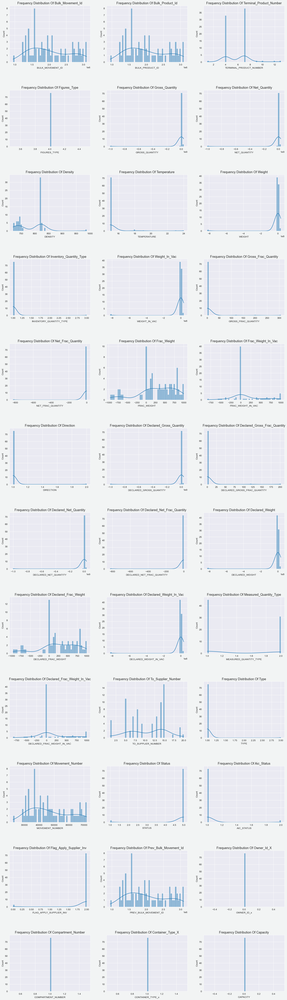

In [53]:
subsampled_data = tb[numerical_features].sample(frac=0.1, random_state=42)

num_rows = (len(numerical_features) + 2) // 3  

fig, axes = plt.subplots(num_rows, 3, figsize=(20, num_rows * 6), facecolor='#F2F4F4')
fig.subplots_adjust(wspace=0.2, hspace=0.5)

axes = axes.flatten()

for i, feature in enumerate(numerical_features):
    h = sns.histplot(x=feature, kde=True, data=subsampled_data, bins=50, ax=axes[i])
    h.set_title(('Frequency Distribution of ' + feature).title(), fontsize=13)

if len(numerical_features) % 3 != 0:
    for i in range(len(numerical_features), num_rows * 3):
        fig.delaxes(axes[i])

plt.show()

## Study of Categorical Features

We identify categorical features and assign them to `categorical_features` variable.

In [54]:
categorical_features = [col for col in tb.columns if tb[col].dtype == "object" ]
print(categorical_features)

['CONTAINER_CODE', 'LAST_USER_NAME', 'NAME']


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">
    
- Our data contains only 3 categorical features.

In [55]:
cat = tb[categorical_features]
cat.head()

,CONTAINER_CODE,LAST_USER_NAME,NAME
0,TK-202,FUELFACS,MOGAS
1,TK-202,FUELFACS,MOGAS
2,TK-202,FUELFACS,MOGAS
3,TK-103,FUELFACS,GASOIL
4,TK-103,ADMIN,GASOIL


We will then use count plots to understand the distribution of categorical data.

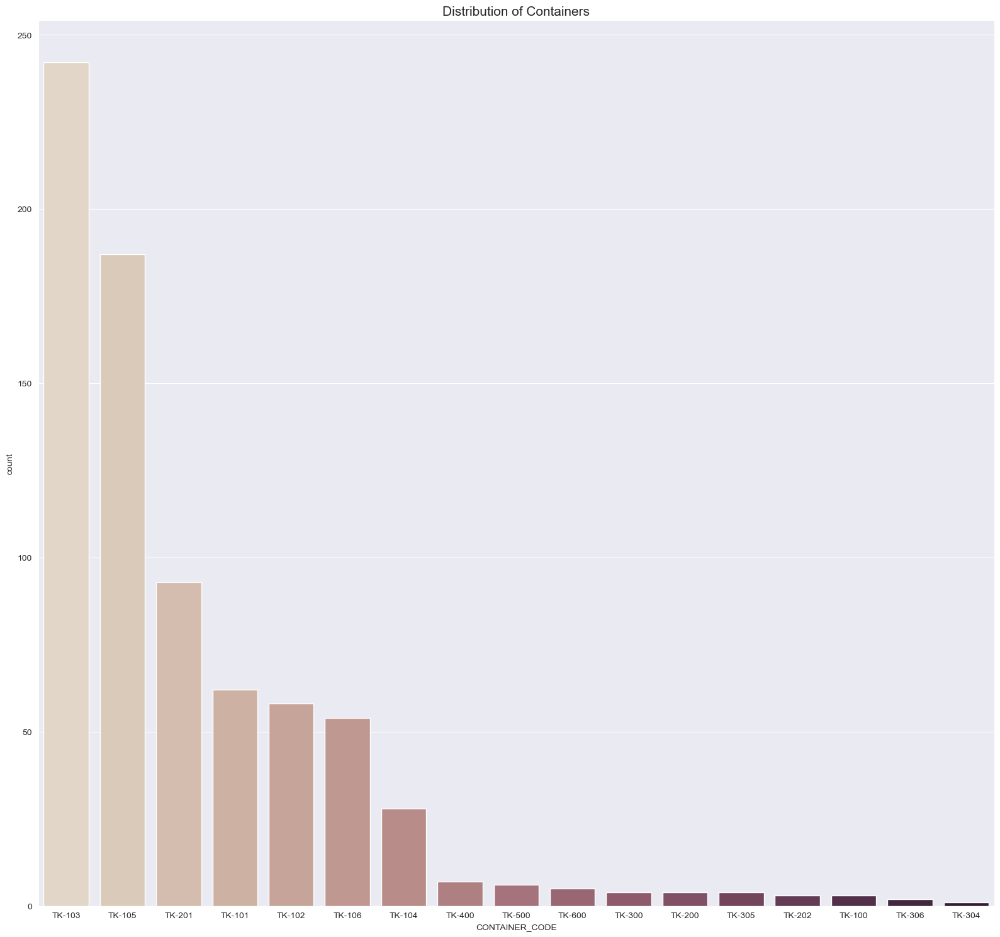

In [56]:
plt.figure(figsize=(16, 15))
sns.set_style('darkgrid')

ax = sns.countplot(x='CONTAINER_CODE', data=tb, order=tb['CONTAINER_CODE'].value_counts().index, palette='ch:.25')

total = len(tb['CONTAINER_CODE'])
for p in ax.patches:
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height() / 2
   

plt.title('Distribution of Containers', fontsize=15)
plt.tight_layout()

plt.show()

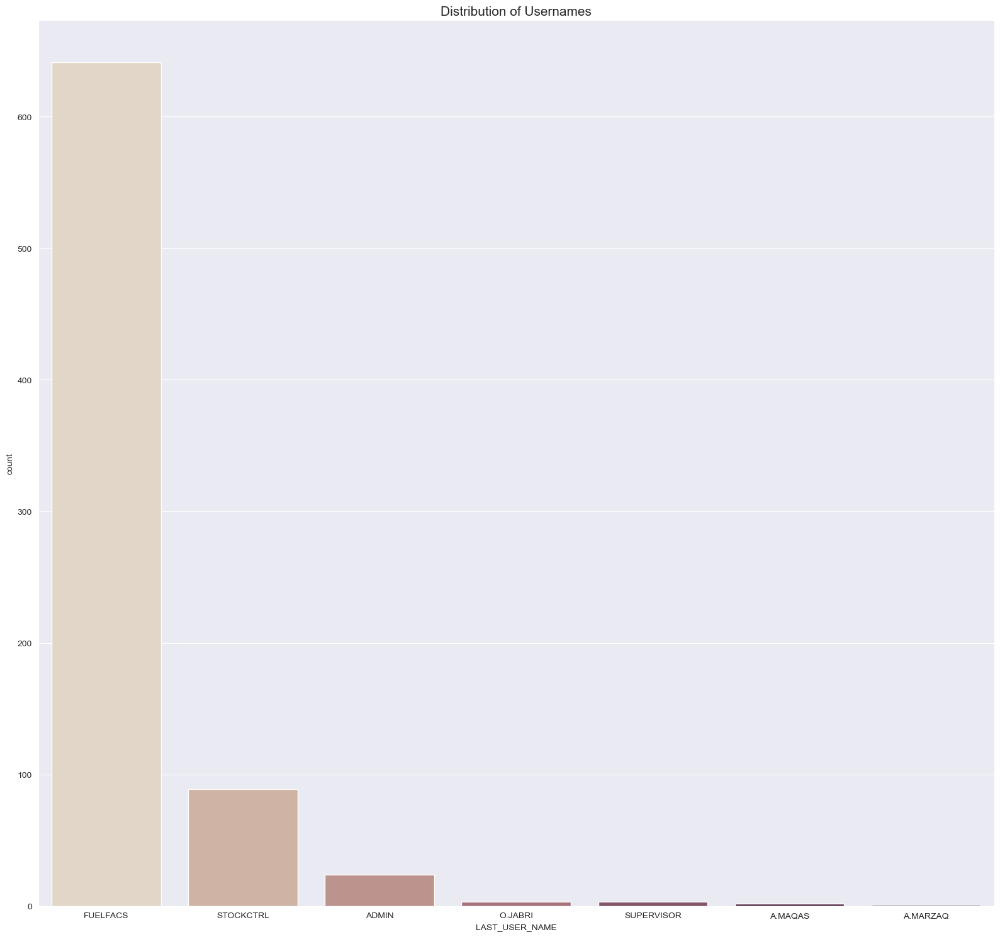

In [57]:
plt.figure(figsize=(16, 15))
sns.set_style('darkgrid')

ax = sns.countplot(x='LAST_USER_NAME', data=tb, order=tb['LAST_USER_NAME'].value_counts().index, palette='ch:.25')

total = len(tb['LAST_USER_NAME'])
for p in ax.patches:
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height() / 2
   

plt.title('Distribution of Usernames', fontsize=15)
plt.tight_layout()

plt.show()

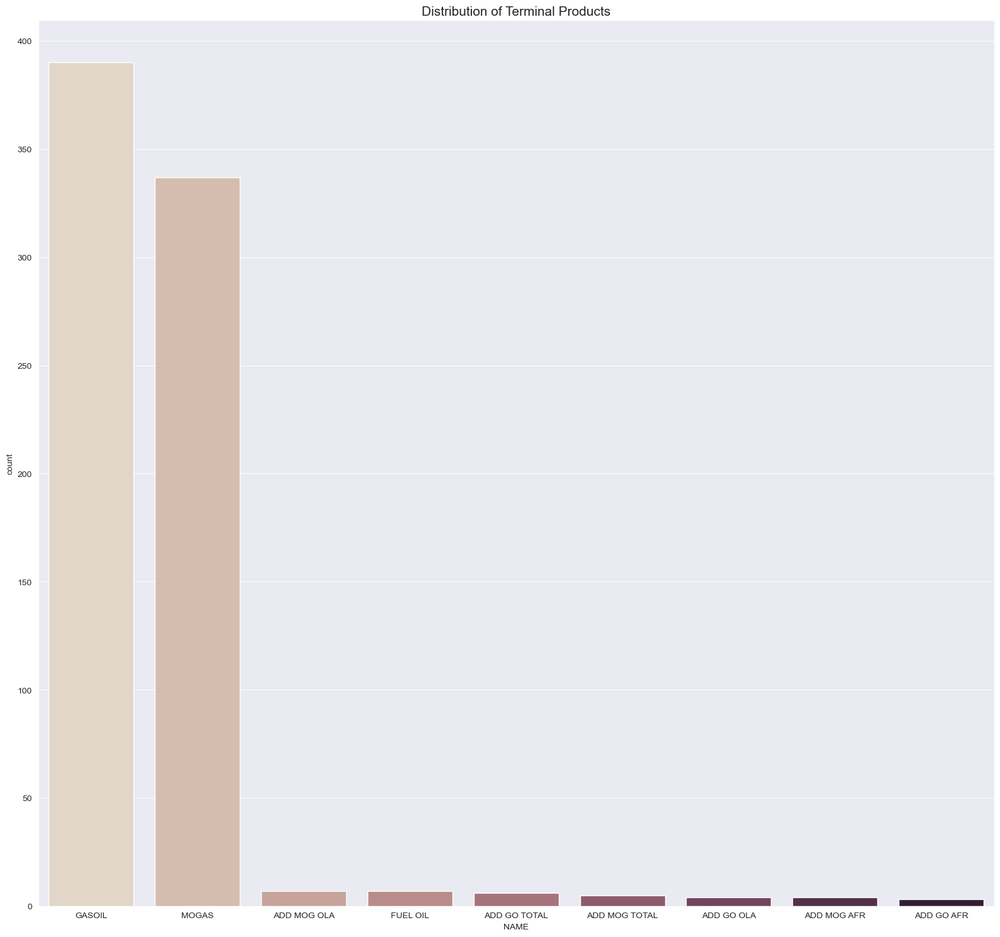

In [58]:
plt.figure(figsize=(16, 15))
sns.set_style('darkgrid')

ax = sns.countplot(x='NAME', data=tb, order=tb['NAME'].value_counts().index, palette='ch:.25')

total = len(tb['NAME'])
for p in ax.patches:
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height() / 2
   

plt.title('Distribution of Terminal Products', fontsize=15)
plt.tight_layout()

plt.show()


## Study of Datetime Features

In [59]:
datetime_features = [col for col in tb.columns if tb[col].dtype in ['datetime64[ns]']]
datetime_features

['LAST_MODIFIED_x',
 'START_DATE',
 'END_DATE',
 'FOLIO_NUMBER',
 'STATUS_DATE',
 'MOVEMENT_DATE',
 'HOST_PROCESSED']

<a id="1"></a> 
# <p style="background-color: #3498db; padding: 20px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);;color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2.5em; text-align: center; font-weight: 600;">Data preprocessing</p> 

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
In this step we have to analyze, filter, transform and encode data so that a machine learning algorithm can understand and work with the processed output.

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Handling Missing Data</p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
Missing values are a recurrent problem in real-world datasets because real-life data has physical and manual limitations.

We will identify missing values

In [60]:
missing_val_count_by_column = (tb.isnull().sum())
columns_with_missing_values =  [col for col in tb.columns
                     if tb[col].isnull().any()]
columns_with_missing_values

['FOLIO_NUMBER']

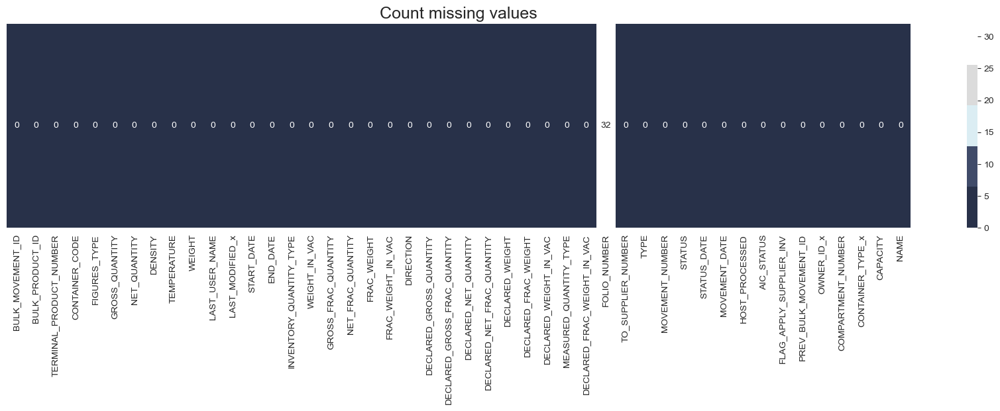

In [61]:
# Missing values
plt.figure(figsize=(22,4))
sns.heatmap((tb.isna().sum()).to_frame(name='').T,cmap=sns.color_palette(["#283149", "#404B69", "#DBEDF3", "#DBDBDB", "#FFFFFF"]), annot=True,
             fmt='0.0f').set_title('Count missing values', fontsize=18)
plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px"> 
    
- Our data contains missing values only on FOLIO_NUMBER column.

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Handling Duplicated Data</p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌 **Duplicate data** refers to the presence of identical records in a dataset, which can distort the analysis and lead to incorrect conclusions. Removing duplicates is crucial for accurate analysis and modeling.

We will check our duplicated data.

In [62]:
tb.duplicated().sum()

0

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px"> 
    
- Our data doesn't contain any duplicated rows.

 ## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Outliers</p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌 Investigating **Outliers** is an essential step in data analysis because they can significantly affect the statistical measures used to describe a dataset. Outliers are observations that differ significantly from other observations in the same dataset and can result from measurement errors, sampling issues, or genuine differences in the population. Identifying and dealing with outliers can help to improve the accuracy and reliability of statistical models and results, leading to more informed decisions and better outcomes. Therefore, outlier investigation is a crucial step in any data analysis process.

In [63]:
tb_numerical = tb[numerical_features]

We defined boxplots to define outliers seperately within each column

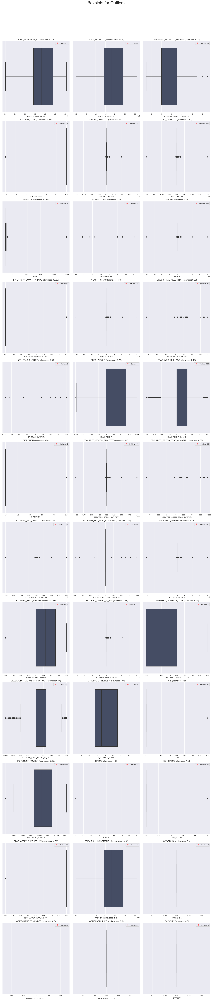

In [64]:
def plot_numerical_features_boxplots(data, columns_list, title):
    num_features = len(columns_list)
    cols = 3
    rows = (num_features + cols - 1) // cols

    sns.set_style('darkgrid')
    fig, axs = plt.subplots(rows, cols, figsize=(18, 7 * rows), sharey=True)
    fig.suptitle(title, fontsize=25, y=1)

    plt.subplots_adjust(hspace=0.5)

    axs = axs.flatten()

    outliers_df = pd.DataFrame(columns=['Column', 'Outlier_index', 'Outlier_values'])

    for i, col in enumerate(columns_list):
        sns.boxplot(x=data[col], color='#404B69', ax=axs[i])
        axs[i].set_title(f'{col} (skewness: {round(float(data[col].skew()), 2)})', fontsize=12)

        #----------------------------
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = ((data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR)))
        outliers_index = data[outliers].index.tolist()
        outliers_values = data[col][outliers].tolist()

    
        outliers_df = pd.concat([outliers_df, pd.DataFrame({'Column': [col], 'Outlier_index': [outliers_index], 'Outlier_values': [outliers_values]})], ignore_index=True)

        axs[i].plot([], [], 'ro', alpha=0.5, label=f'Outliers: {outliers.sum()}')
        axs[i].legend(loc='upper right', fontsize=10)

    for i in range(num_features, rows * cols):
        axs[i].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.97])  # Adjust the layout
    return outliers_df

outliers_df_result = plot_numerical_features_boxplots(data=tb_numerical, columns_list=tb_numerical.columns, title='Boxplots for Outliers')


# <p style="background-color: #3498db; padding: 20px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2.5em; text-align: center; font-weight: 600;">Exploratory Data Analysis (EDA)</p>


 ## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Univariate Analysis</p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌 In every technique which comes under the hood of **Univariate Analysis**, every feature is individually studied and the relationship it shares with the target variable is taken into account.

We will see at first the distribution of the numerical values data using mean, median, Q1 and Q3.

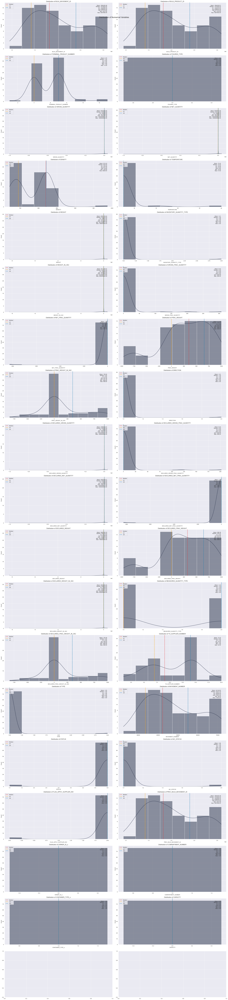

In [65]:
# Check variables distribution
subsampled_data = tb[numerical_features].sample(frac=0.1, random_state=42)

num_rows = (len(numerical_features) + 2) // 2  # Adjust the number of columns as needed
fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(26, num_rows * 6))

# Define colors to use for each feature
colors = ["#283149"]

# Loop through each column and plot distribution
for i, column in enumerate(numerical_features):
    # Plot histogram with density curve
    sns.histplot(x=column, data=subsampled_data, color=colors[i%1], ax=axes[i//2, i%2], kde=True)
    
    # Add vertical lines for mean, median, Q1 and Q3
    axes[i//2, i%2].axvline(x=tb[column].median(), color='#e33434', linestyle='--', linewidth=2, label='Median')
    axes[i//2, i%2].axvline(x=tb[column].quantile(0.25), color='orange', linestyle='--', linewidth=2, label='Q1')
    axes[i//2, i%2].axvline(x=tb[column].quantile(0.75), color='#177ab0', linestyle='--', linewidth=2, label='Q3')
    
    # Add text box with important statistics
    median = tb[column].median()
    q1 = tb[column].quantile(0.25)
    q3 = tb[column].quantile(0.75)
    iqr = q3 - q1
    axes[i//2, i%2].text(0.95, 0.95, 
                          'Mean: {:.2f}\nMedian: {:.2f}\nQ1: {:.2f}\nQ3: {:.2f}\nIQR: {:.2f}\nMin: {:.2f}\nMax: {:.2f}'.format(
                              tb[column].mean(), median, q1, q3, iqr, tb[column].min(), tb[column].max()),
                          transform=axes[i//2, i%2].transAxes,
                          fontsize=10, va='top', ha='right')
    
    # Add legend
    axes[i//2, i%2].legend(loc = "upper left")
    
    # Set title of subplot
    axes[i//2, i%2].set_title('Distribution of '+ column)

        
# Add overall title and adjust spacing
fig.suptitle('Distribution of Numerical Variables', fontsize=16)
fig.tight_layout()

 ### <p style="background-color: #3498db; padding: 8px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.5em; text-align: center; font-weight: 600;">Study of container behavior </p>

After checking the distribution of numerical vairables using mean and quartiles, we're gonna study the behavior of each container

In [66]:
container.shape

(762, 4)

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px"> 
    
- We can see that the container dataset has initially 762 rows which means 762 different containers.
- But after the merge with bulk datasets, we conclude that the containers from TK-100 to TK-600 are bulks.

In [67]:
container_mapping_table = tb.groupby('CONTAINER_CODE')['NAME'].first().reset_index()

# Create a DataFrame
container_mapping_df = pd.DataFrame({
    'CONTAINER_CODE': container_mapping_table['CONTAINER_CODE'],
    'NAME': container_mapping_table['NAME']
})

print(container_mapping_df)

   CONTAINER_CODE           NAME
0          TK-100     ADD GO AFR
1          TK-101         GASOIL
2          TK-102         GASOIL
3          TK-103         GASOIL
4          TK-104         GASOIL
5          TK-105          MOGAS
6          TK-106          MOGAS
7          TK-200    ADD MOG AFR
8          TK-201          MOGAS
9          TK-202          MOGAS
10         TK-300     ADD GO OLA
11         TK-304       FUEL OIL
12         TK-305       FUEL OIL
13         TK-306       FUEL OIL
14         TK-400    ADD MOG OLA
15         TK-500   ADD GO TOTAL
16         TK-600  ADD MOG TOTAL


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px"> 

- Using this table, we can see the mapping of each container to its terminal product so we can understand more about these containers.

We count the distribtion of terminal products within each container so we can understand the main product each container is handling.

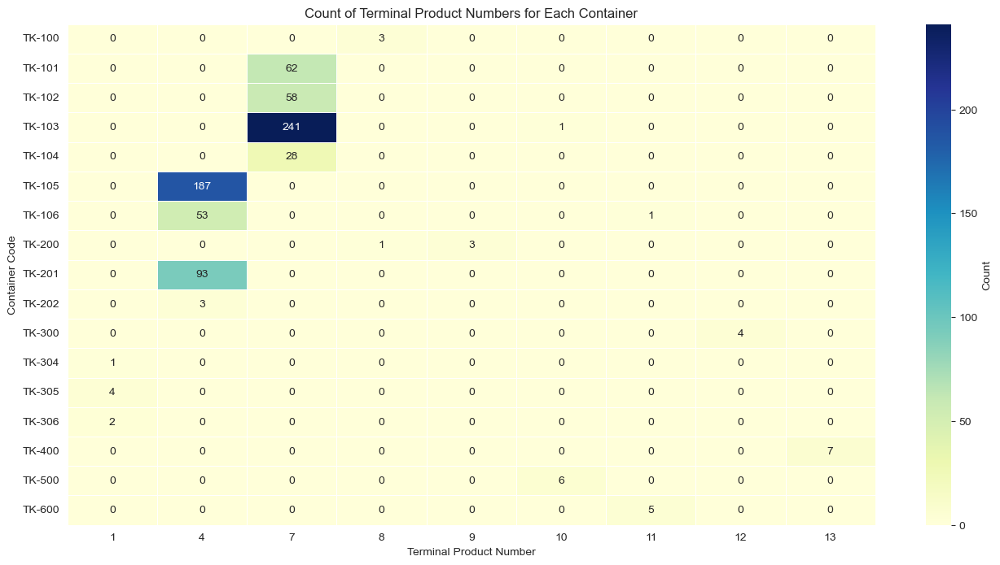

In [68]:
product_count_data = tb.groupby(['CONTAINER_CODE', 'TERMINAL_PRODUCT_NUMBER']).size().reset_index(name='COUNT')

# Pivot the DataFrame to have CONTAINER_CODE as rows and TERMINAL_PRODUCT_NUMBER as columns
pivot_data = product_count_data.pivot(index='CONTAINER_CODE', columns='TERMINAL_PRODUCT_NUMBER', values='COUNT').fillna(0)

# Set a larger plot size
plt.figure(figsize=(16, 8))

# Use seaborn's heatmap to create an advanced plot
sns.heatmap(pivot_data, cmap="YlGnBu", annot=True, fmt='g', linewidths=.5, cbar_kws={'label': 'Count'})

plt.xlabel('Terminal Product Number')
plt.ylabel('Container Code')
plt.title('Count of Terminal Product Numbers for Each Container')
plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px"> 
    
- For example, we can see that terminal products 4 and 7 are more foreign in the dataset than the others.
- This count plot helped us identify the terminal products based on their distribution on containers.
- So we came up with this descritpion of terminal products numbers mapped to each value of the NAME column:
    
1: FUEL OIL
    
4: MOGAS
    
7: GASOIL
    
8: ADD GO AFR
    
9: ADD MOGAZ AFR
    
10: ADD GO TOTAL
    
11: ADD MOGAZ TOTAL
    
12: ADD GO OLA
    
13: ADD MOGAZ OLA

- Numbers from 1 to 7 are oil products.
- Numbers from 8 to 13 are additives.    

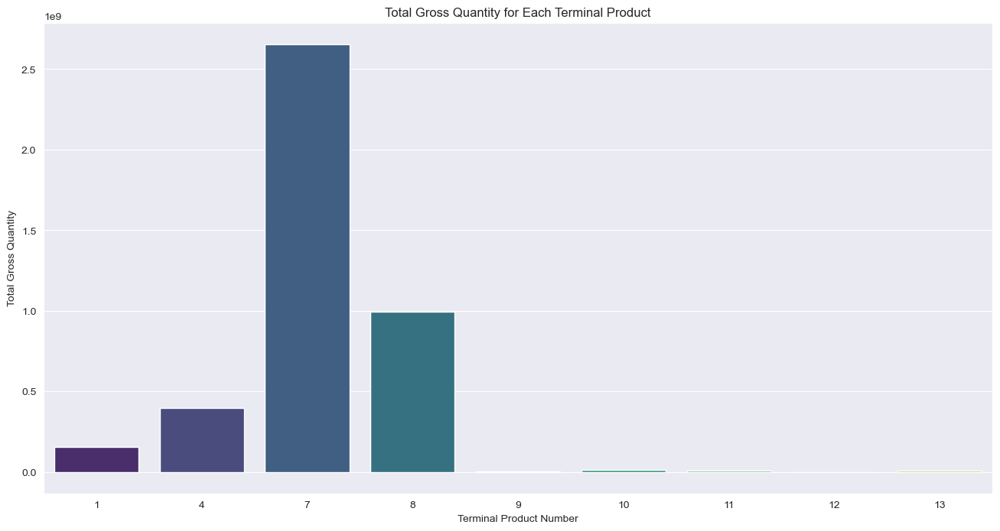

In [69]:
gross_quantity_data = tb.groupby(['TERMINAL_PRODUCT_NUMBER'])['GROSS_QUANTITY'].sum().reset_index()

# Set a larger plot size
plt.figure(figsize=(16, 8))

# Use seaborn's barplot to create a plot of total gross quantity for each terminal product in each container
sns.barplot(x='TERMINAL_PRODUCT_NUMBER', y='GROSS_QUANTITY', data=gross_quantity_data, palette='viridis')

plt.xlabel('Terminal Product Number')
plt.ylabel('Total Gross Quantity')
plt.title('Total Gross Quantity for Each Terminal Product')
plt.show()

#### <p style="background-color: #3498db; padding: 5px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.3em; text-align: center; font-weight: 600;">Actual and declared gross quantites comparison </p>

We compare the actual and declared gross quantities within each container over time starting by the month of january.

### Comparison of declared and actual gross quantities in each container over time (Month of January)

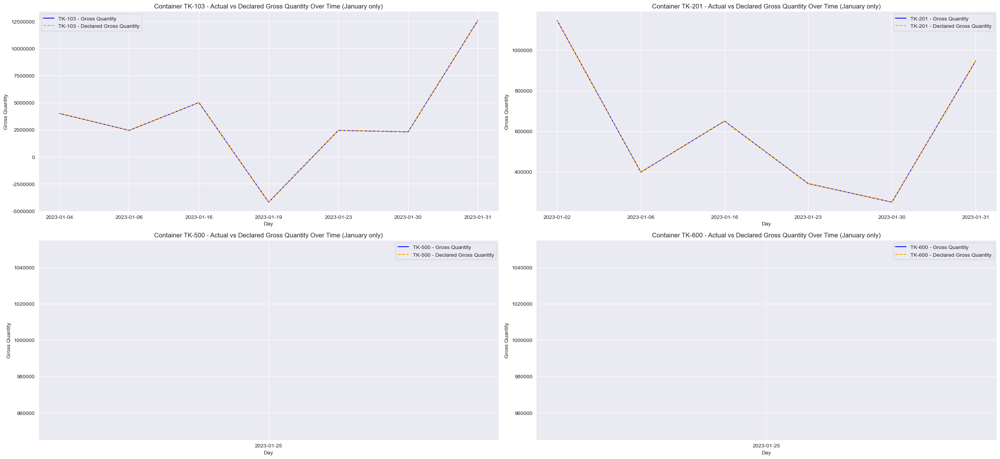

In [72]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 1]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)

# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (January only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of February)

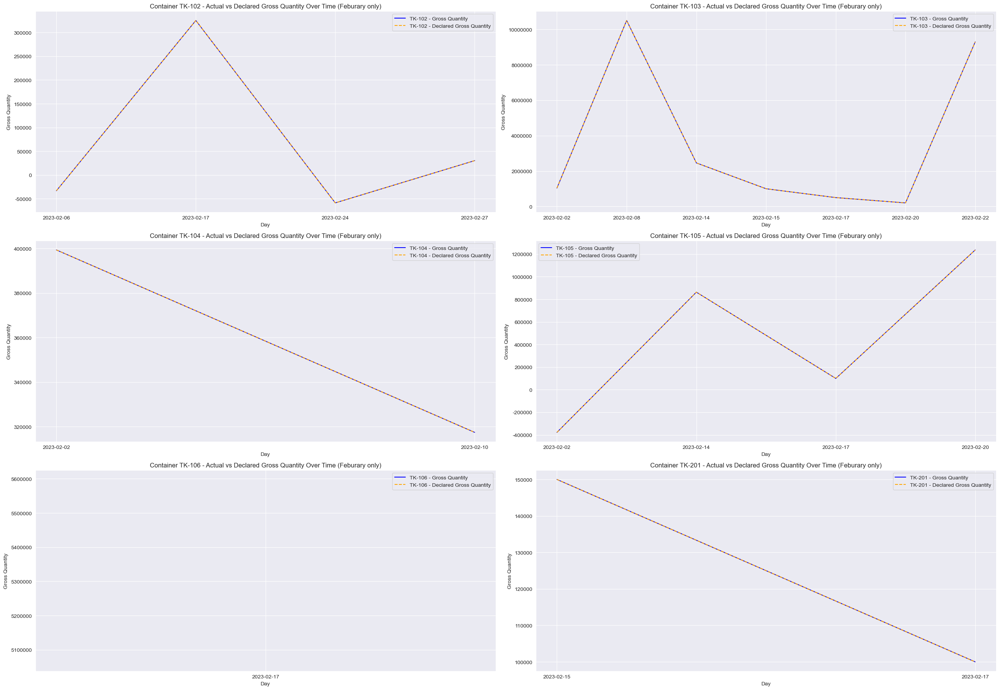

In [74]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 2]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)

# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (Feburary only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of March)

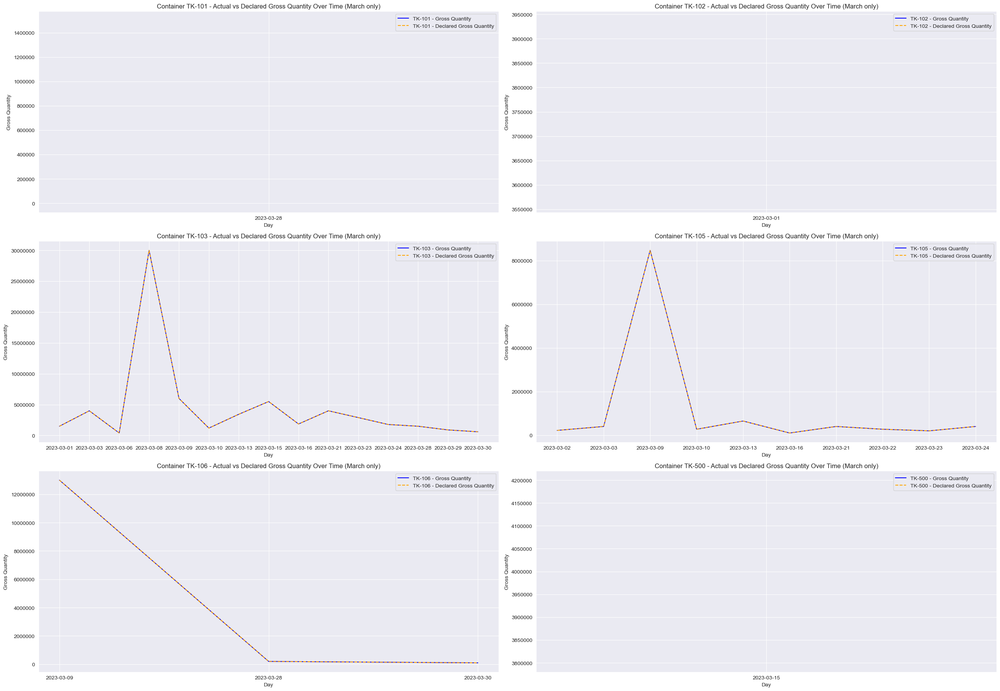

In [75]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 3]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (March only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of April)

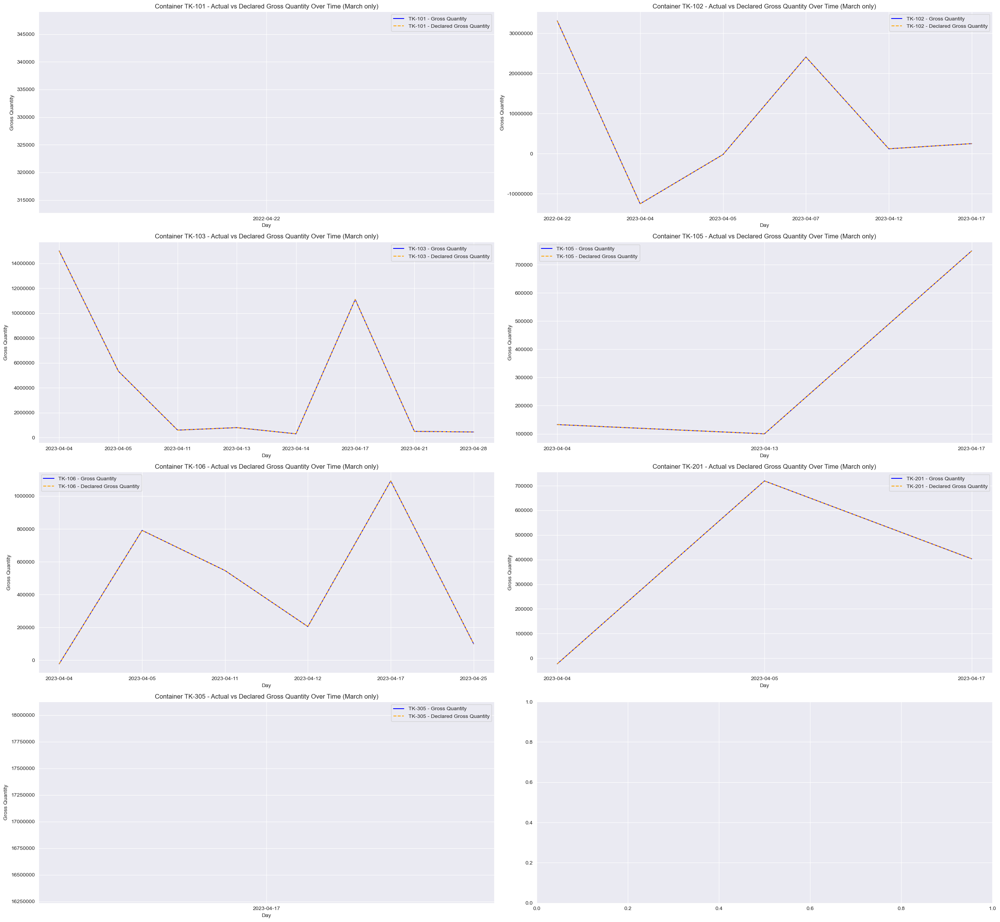

In [76]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 4]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (March only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of May)

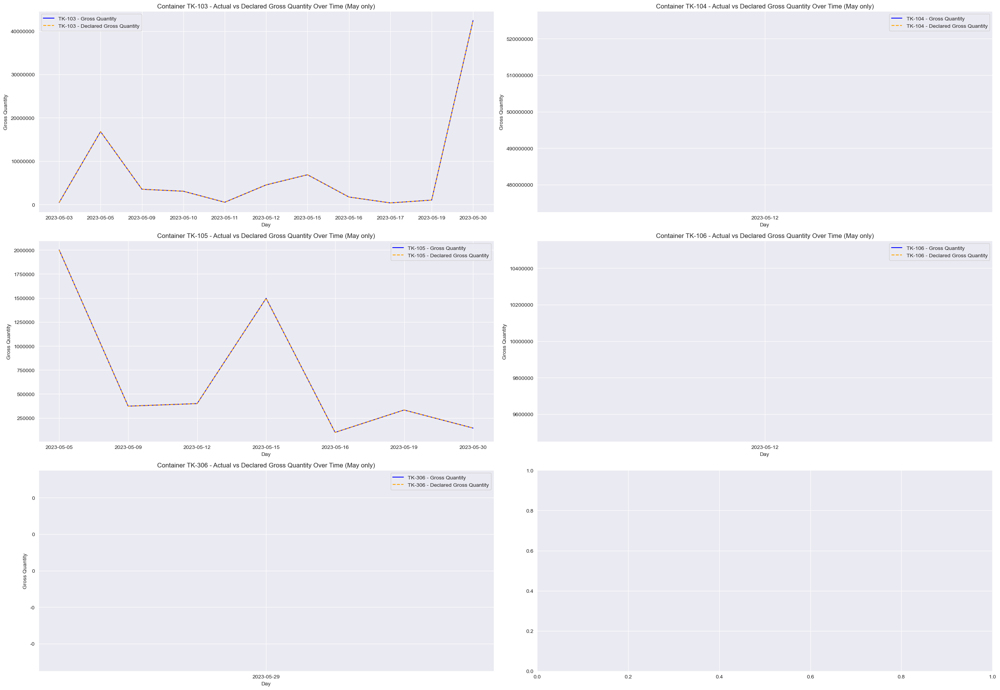

In [77]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 5]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (May only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of June)

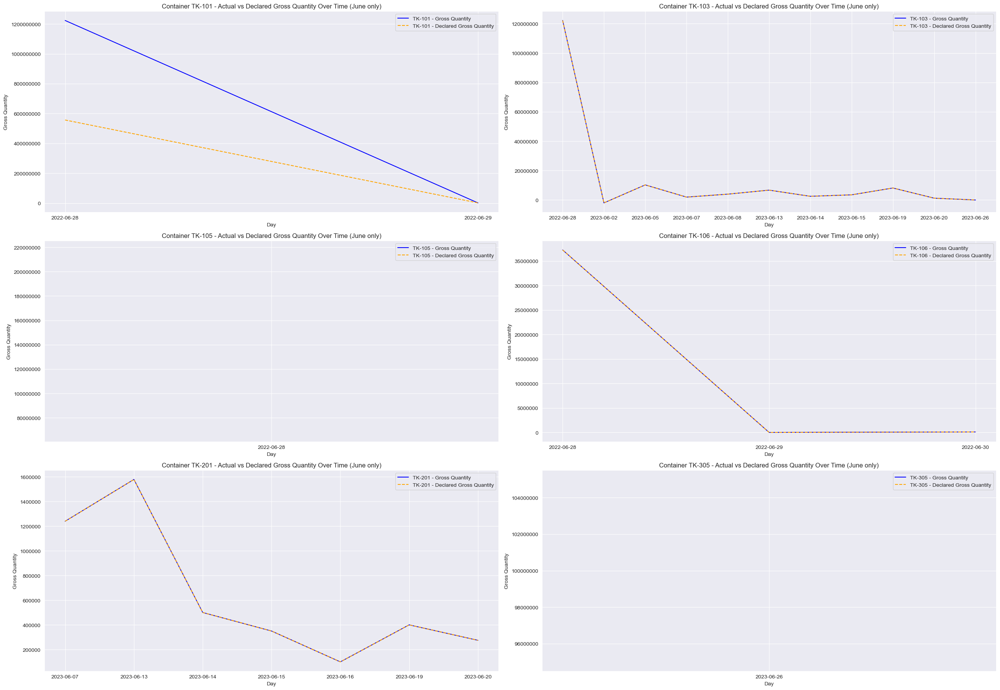

In [78]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 6]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (June only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantitiesin each container over time (Month of July)

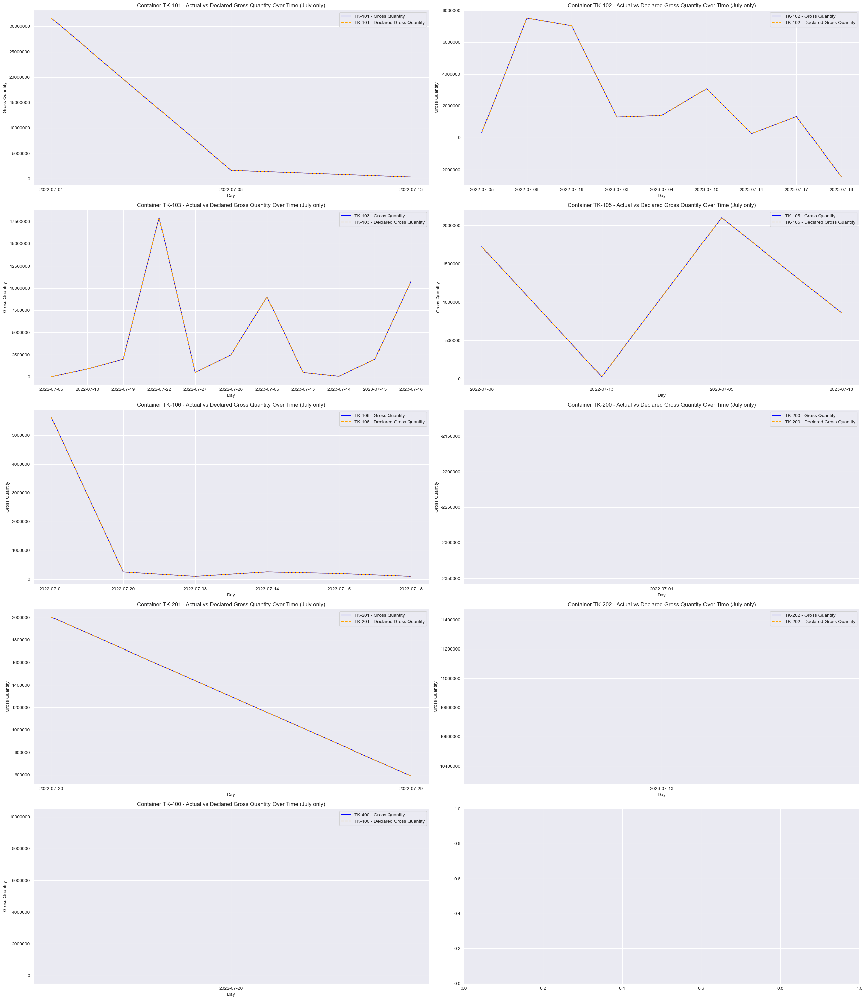

In [79]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 7]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (July only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of August)

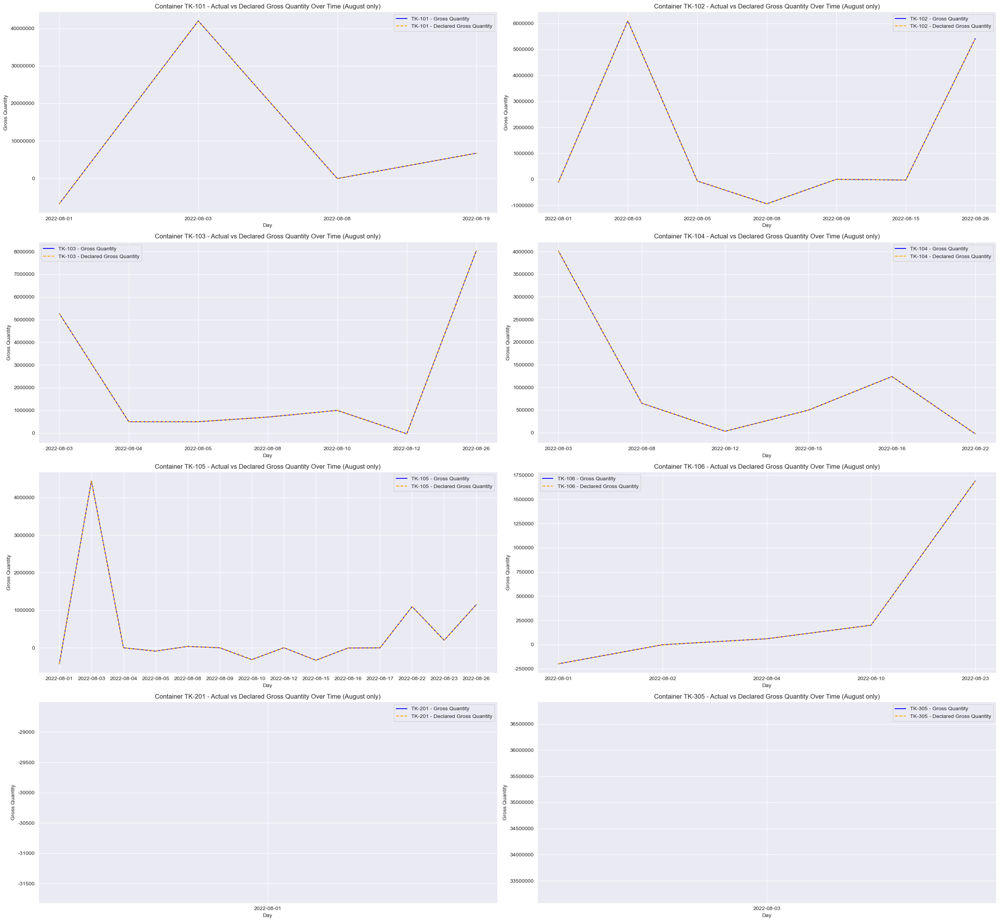

In [80]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 8]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (August only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of September)

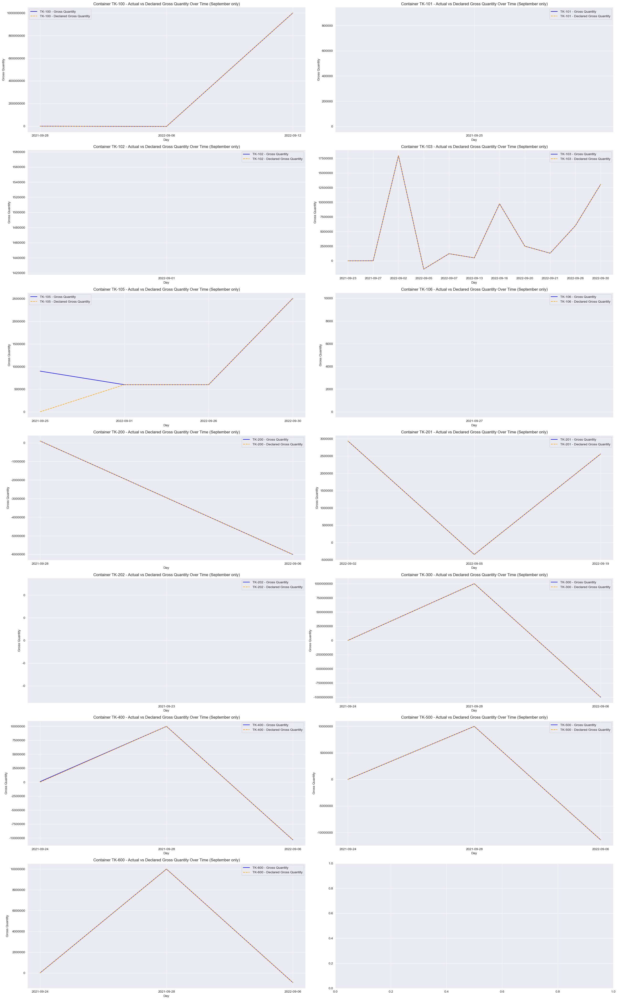

In [81]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 9]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (September only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of October)

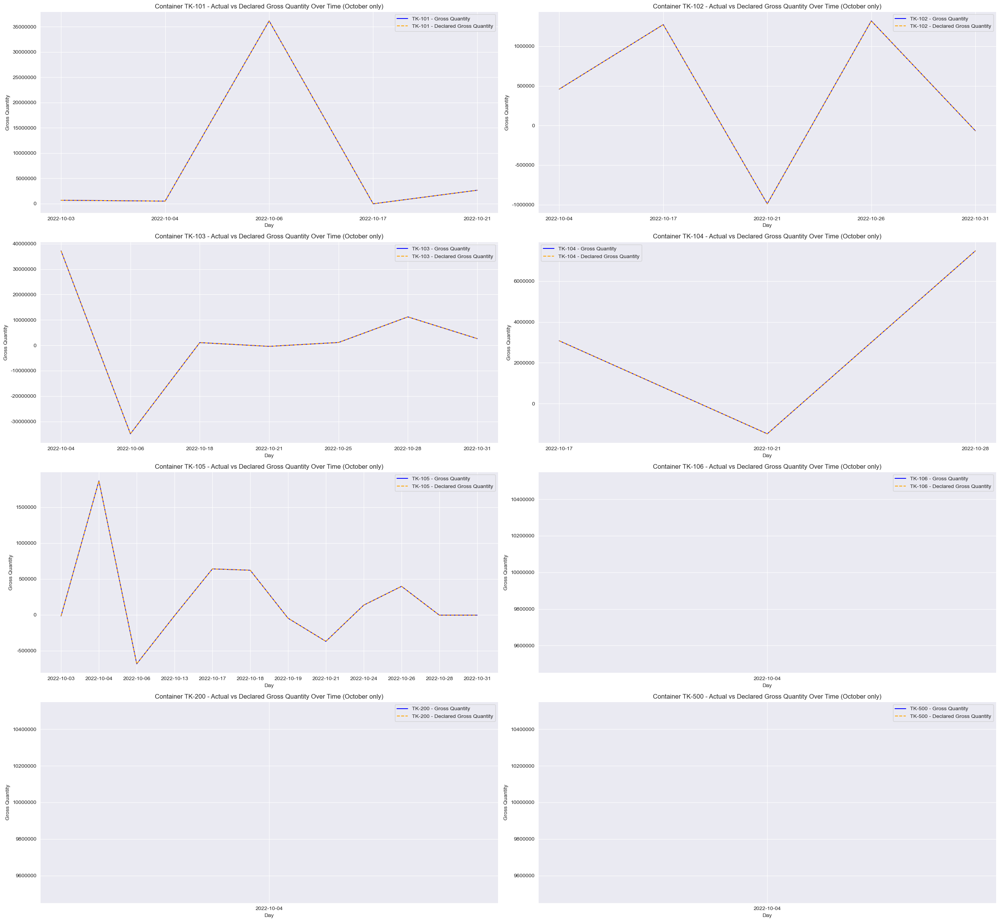

In [82]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 10]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (October only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of November)

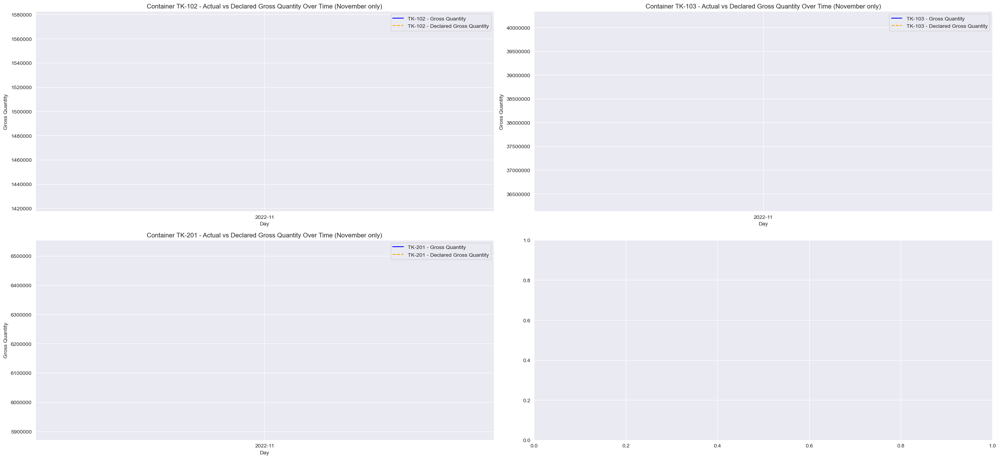

In [83]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('M')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 11]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (November only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of declared and actual gross quantities in each container over time (Month of December)

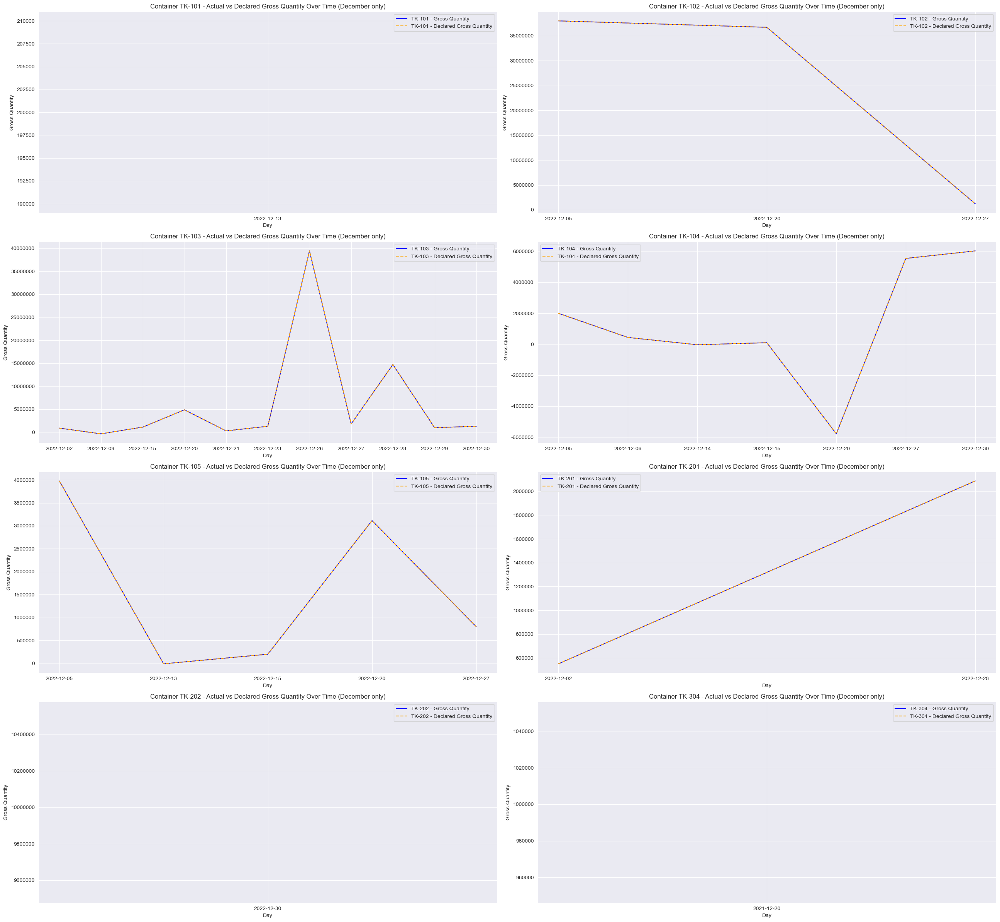

In [84]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 12]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'DECLARED_GROSS_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['DECLARED_GROSS_QUANTITY'], linestyle='--', label=f'{container_code} - Declared Gross Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual vs Declared Gross Quantity Over Time (December only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

#### <p style="background-color: #3498db; padding: 5px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.3em; text-align: center; font-weight: 600;">Actual gross and net quantites comparison </p>

Like the previous section, we compare the actual gross and net quantities within each container over time.

### Comparison of actual gross and net gross quantities in each container over time (Month of January)

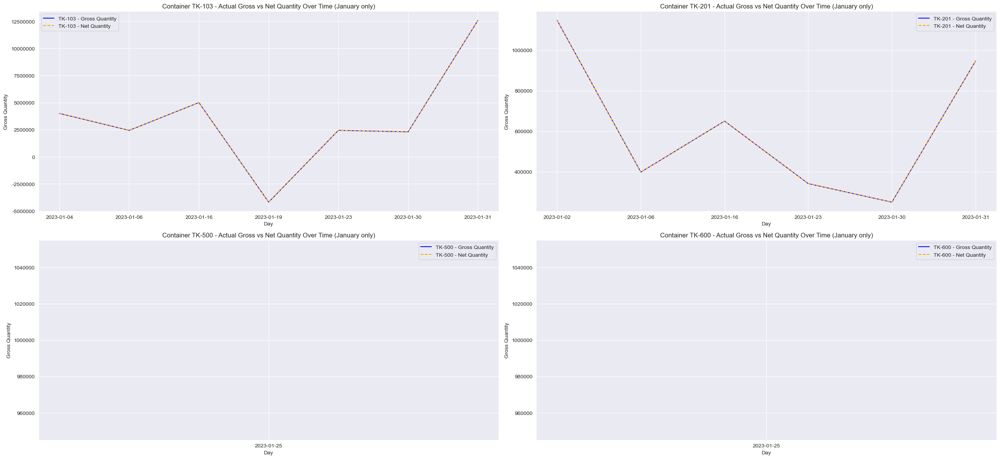

In [85]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 1]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (January only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net gross quantities in each container over time (Month of February)

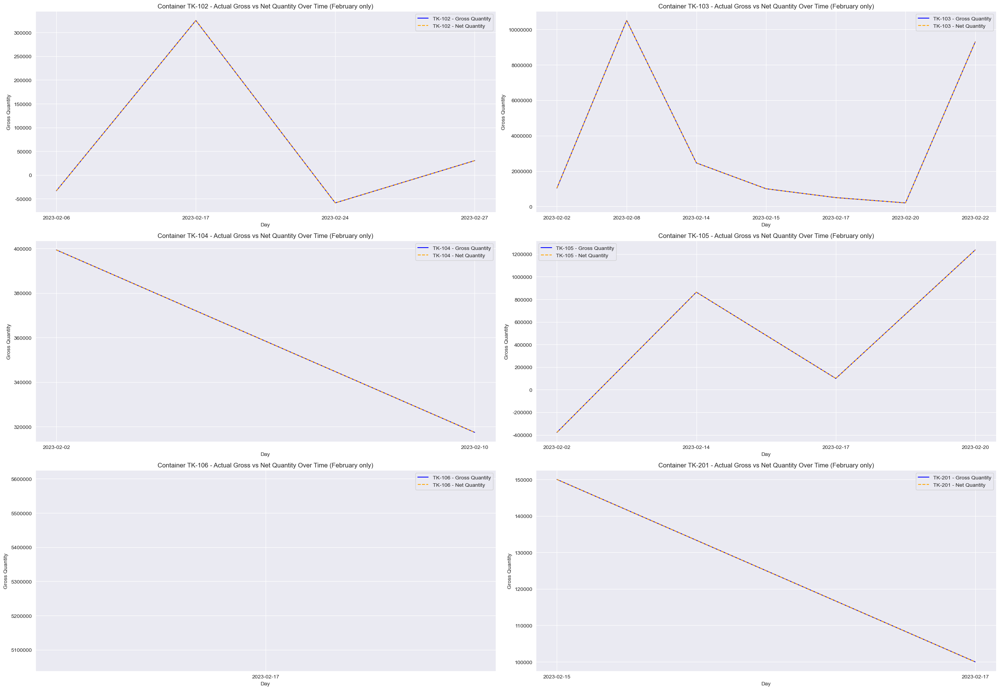

In [86]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 2]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (February only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net gross quantities in each container over time (Month of March)

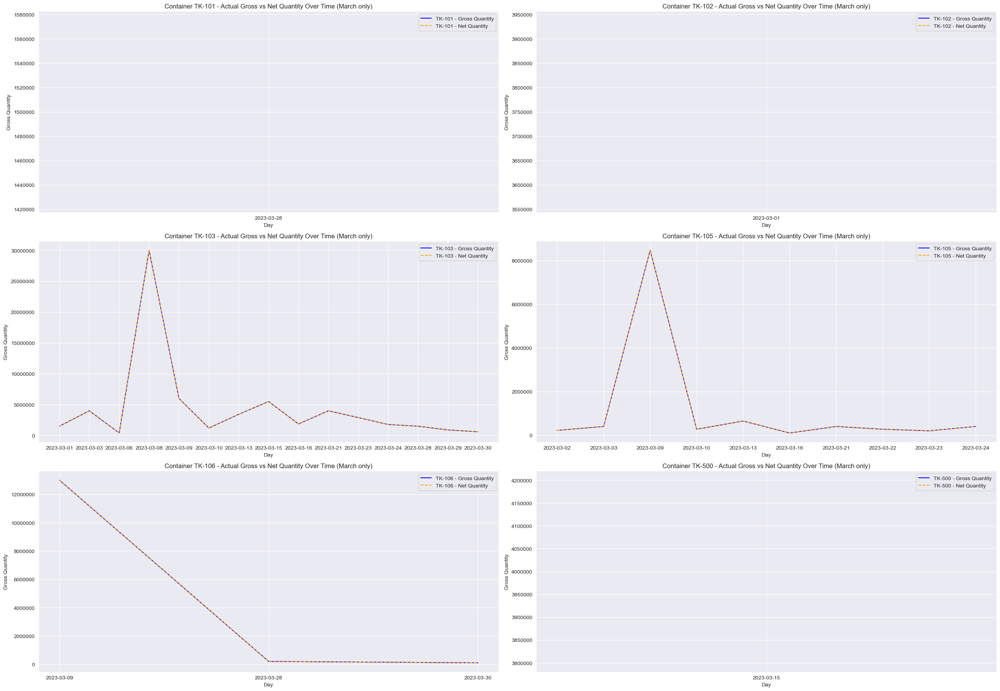

In [88]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 3]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (March only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of April)

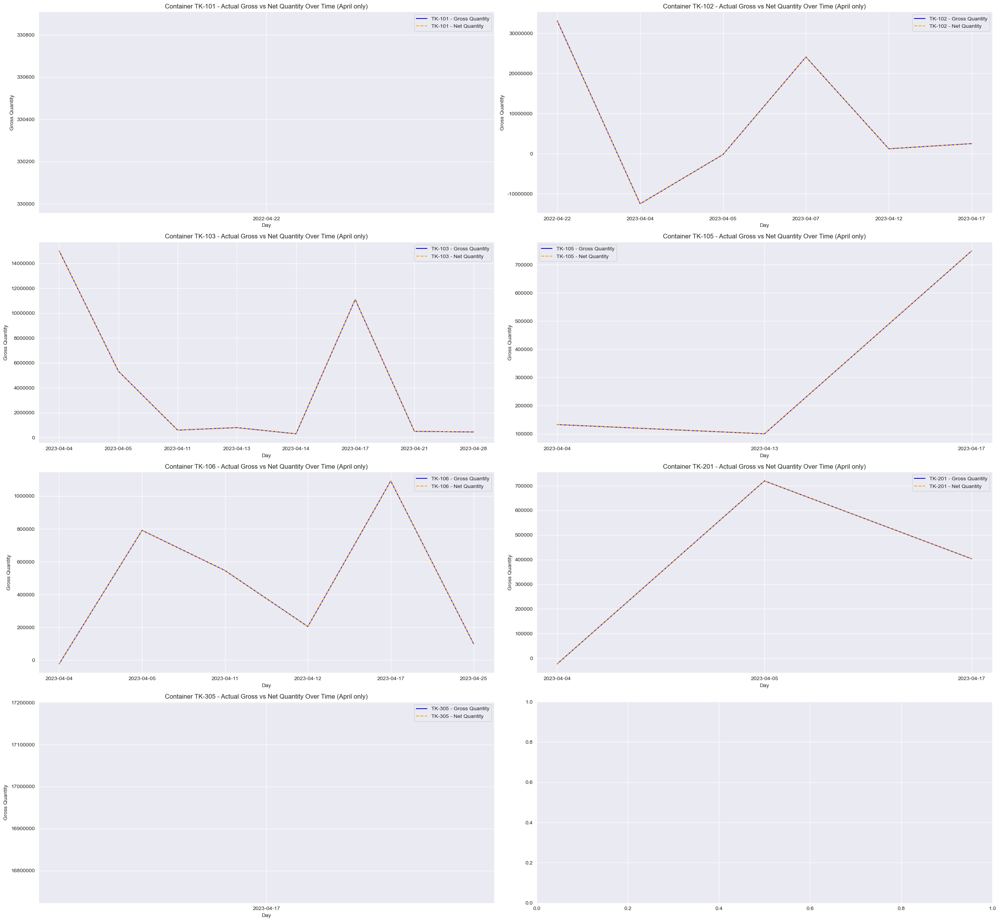

In [89]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 4]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (April only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of May)

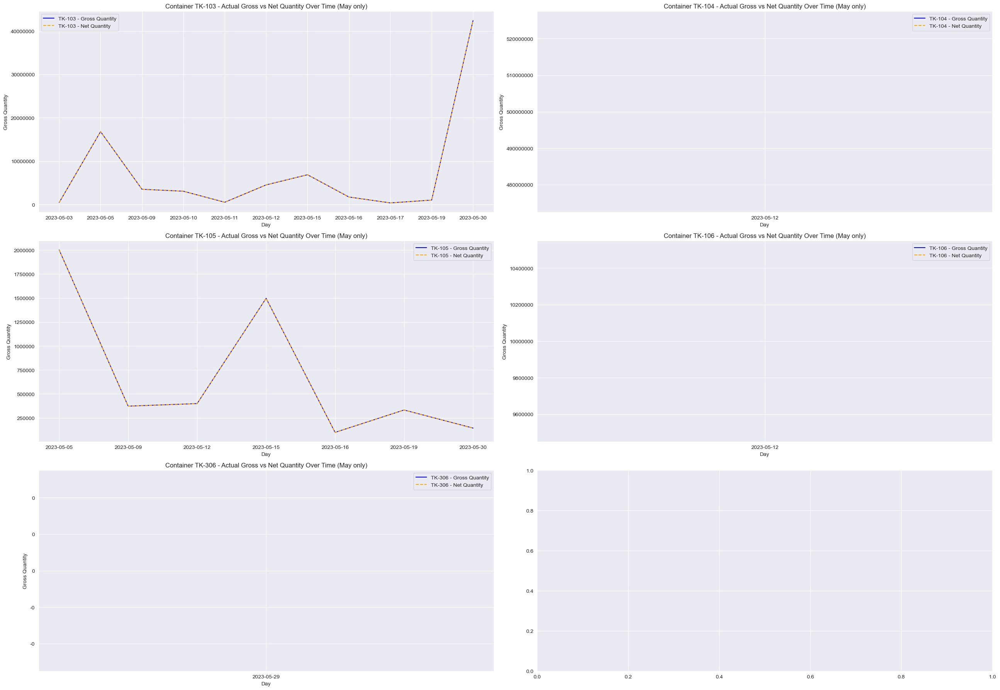

In [90]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 5]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (May only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of June)

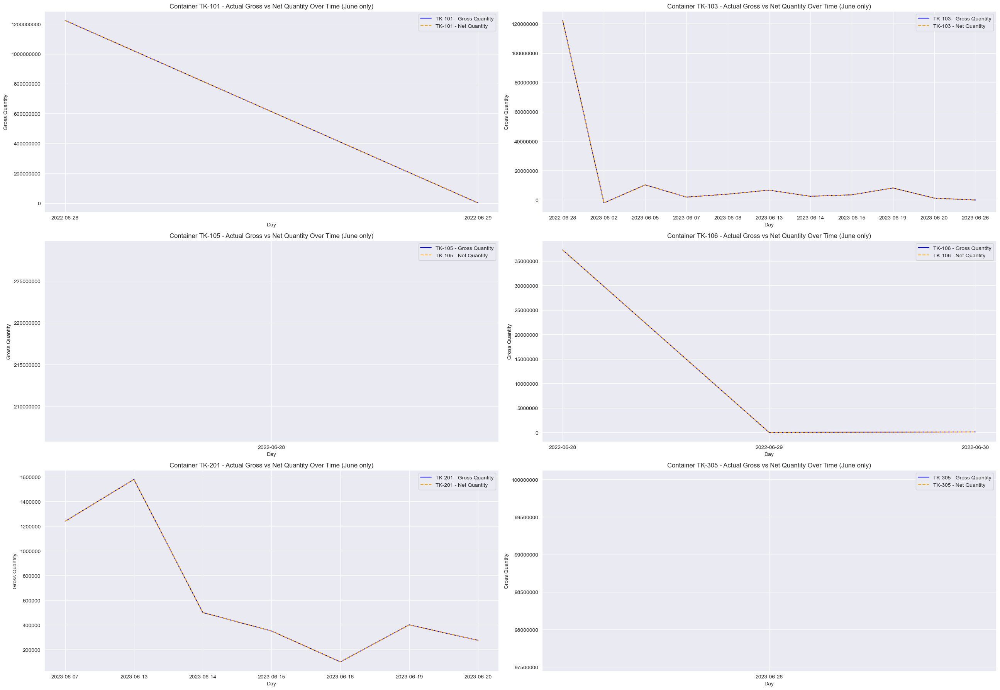

In [91]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 6]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (June only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of July)

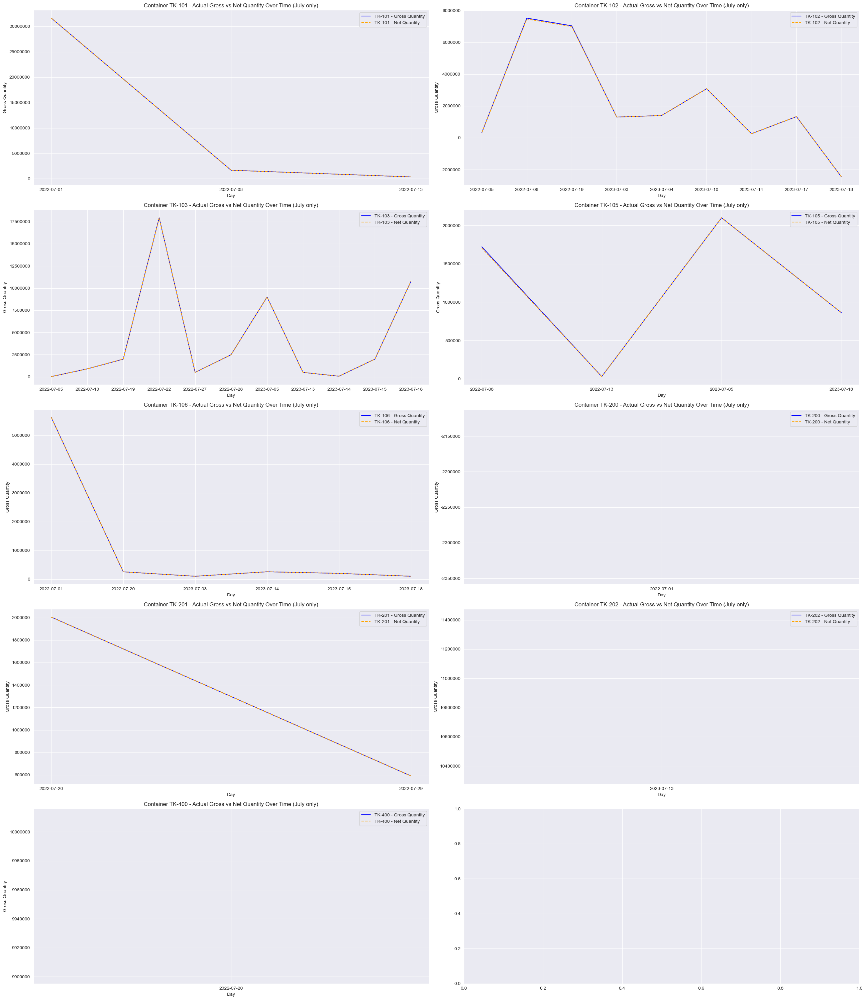

In [92]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 7]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (July only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of August)

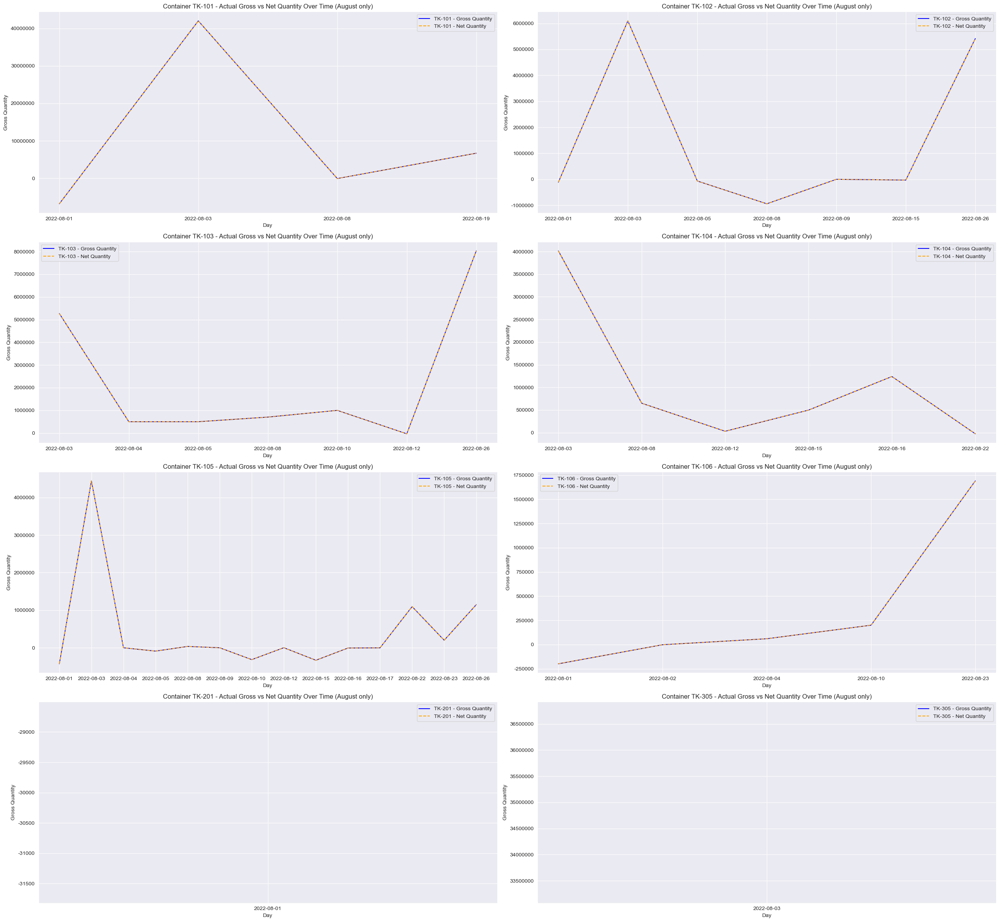

In [93]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['MONTH'] = tb['START_DATE'].dt.to_period('M')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 8]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (August only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of September)

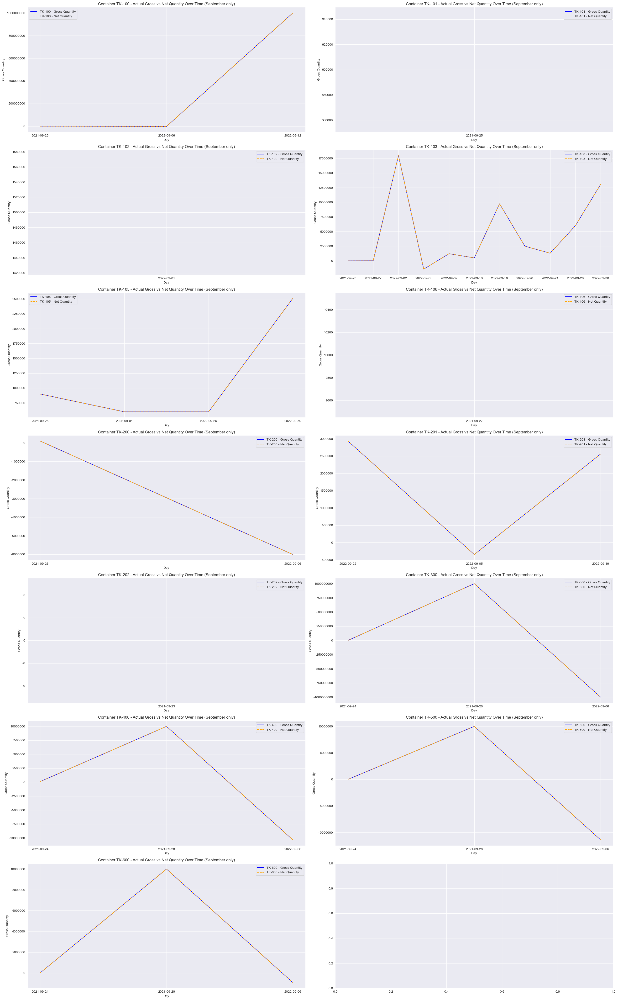

In [95]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 9]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (September only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of October)

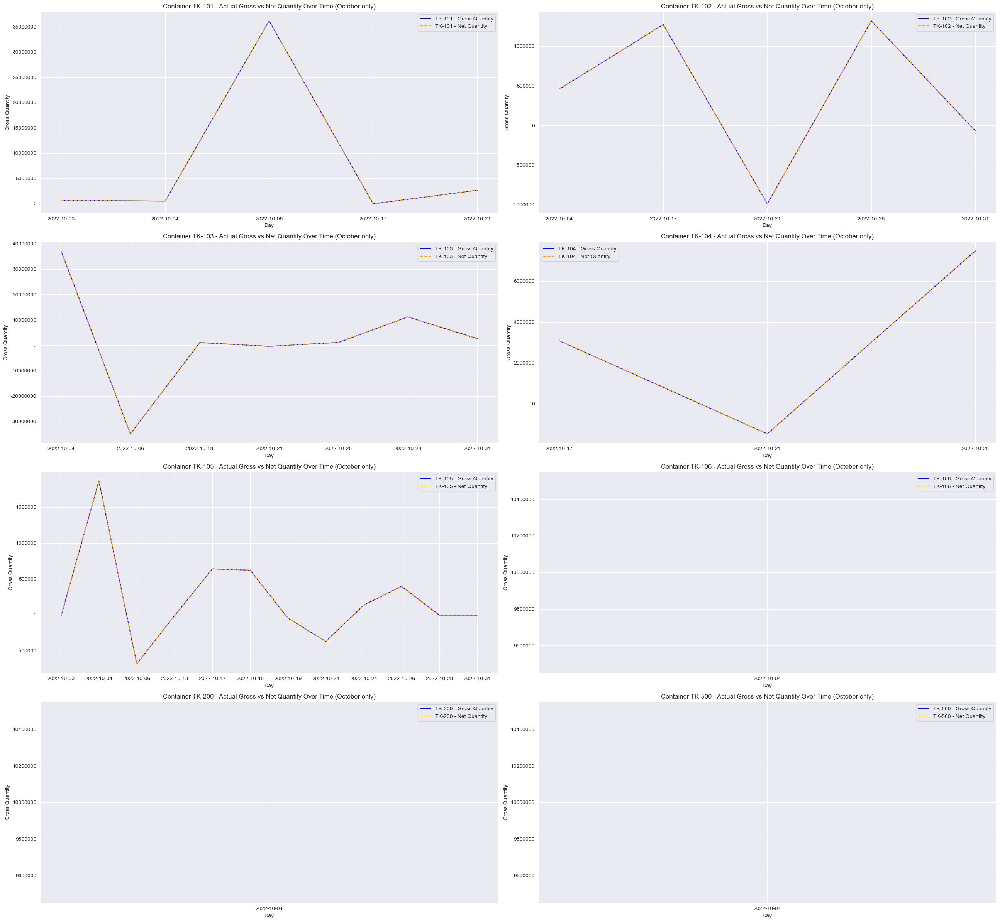

In [96]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 10]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (October only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of November)

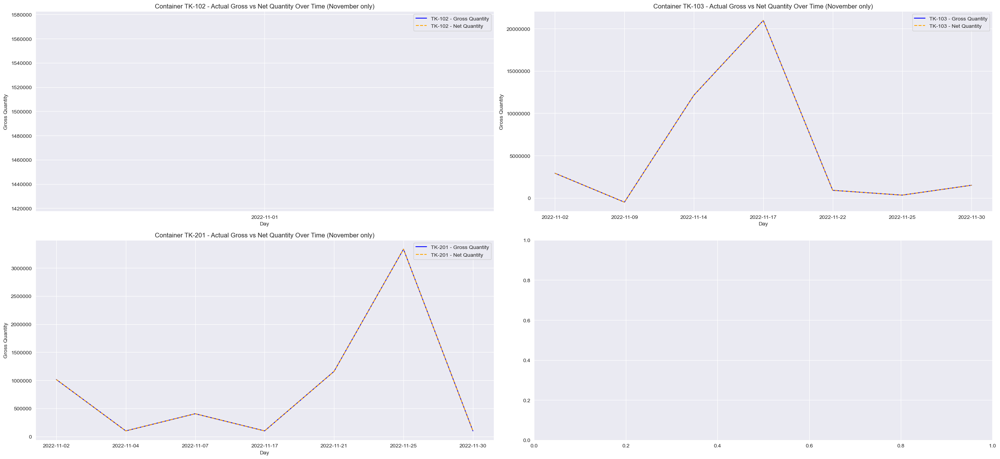

In [97]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 11]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (November only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

### Comparison of actual gross and net quantities in each container over time (Month of December)

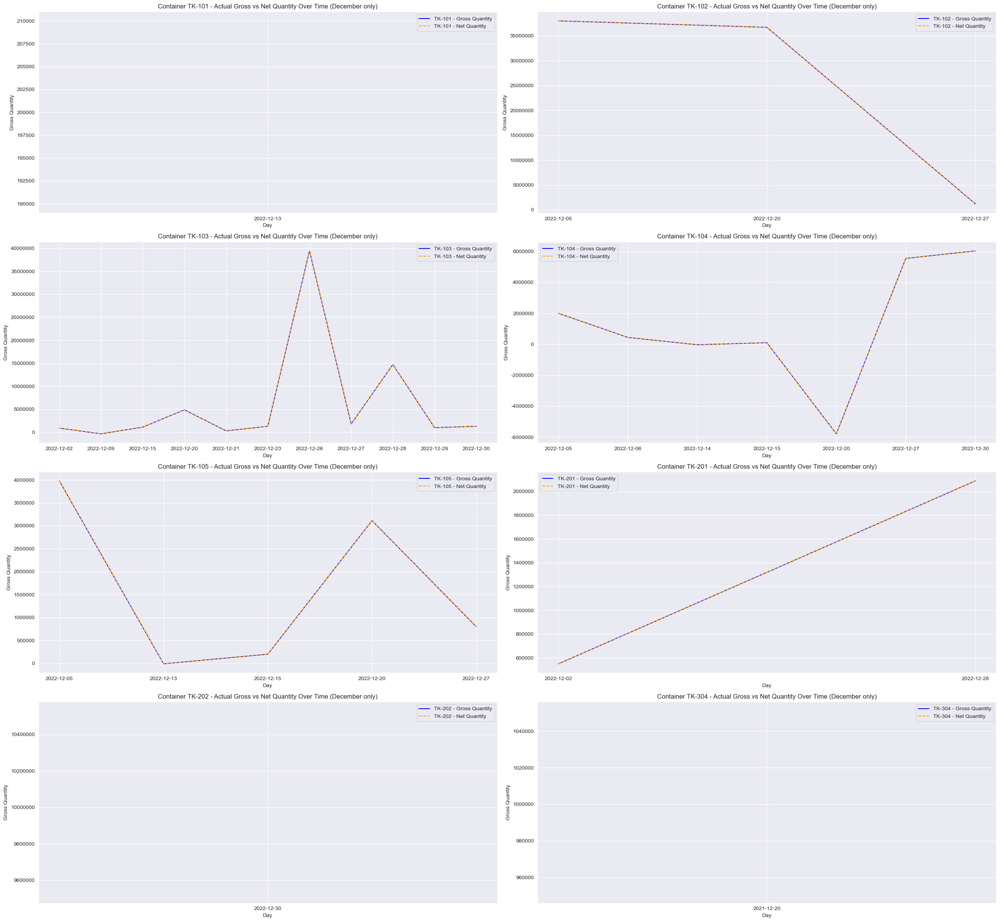

In [98]:
tb['START_DATE'] = pd.to_datetime(tb['START_DATE'])

# Extract the month from the 'START_DATE' column
tb['DAY'] = tb['START_DATE'].dt.to_period('D')

# Filter data for the month of June
tb_january = tb[tb['START_DATE'].dt.month == 12]


# Group the data by 'CONTAINER_CODE' and 'MONTH' and sum the gross and net quantities
grouped_data = tb_january.groupby(['CONTAINER_CODE', tb_january['DAY']]).agg({
    'GROSS_QUANTITY': 'sum',
    'NET_QUANTITY': 'sum',
}).reset_index()

# Convert Periodto string for plotting
grouped_data['DAY'] = grouped_data['DAY'].astype(str)
# Get the number of unique containers
num_containers = len(grouped_data['CONTAINER_CODE'].unique())

# Calculate the number of rows and columns for subplots
num_rows = math.ceil(num_containers / 2)
num_cols = min(2, num_containers)  # Ensure there are at most 2 columns

# Set a larger plot size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(26, num_rows * 6))

# Flatten the axes if there is only one row
axes = axes.flatten() if num_rows > 1 else [axes]

# Plot actual gross quantity and declared gross quantity for each container in separate subplots
for i, container_code in enumerate(grouped_data['CONTAINER_CODE'].unique()):
    container_data = grouped_data[grouped_data['CONTAINER_CODE'] == container_code]

    ax = axes[i]
    ax.plot(container_data['DAY'], container_data['GROSS_QUANTITY'], label=f'{container_code} - Gross Quantity', color='blue')
    ax.plot(container_data['DAY'], container_data['NET_QUANTITY'], linestyle='--', label=f'{container_code} - Net Quantity', color='orange')

    ax.set_xlabel('Day')
    ax.set_ylabel('Gross Quantity')
    ax.legend()
    ax.set_title(f'Container {container_code} - Actual Gross vs Net Quantity Over Time (December only)')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))

plt.tight_layout()
plt.show()

#### <p style="background-color: #3498db; padding: 5px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.3em; text-align: center; font-weight: 600;">Temperature, weight and density distribution within each container </p>

 ### <p style="background-color: #3498db; padding: 8px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.5em; text-align: center; font-weight: 600;">Variance </p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌 **Variance** is the measure of change in a given feature. For example, if all the samples in a feature have the same values, it would mean that the variance of that feature is zero. It’s essential to understand that a column which doesn’t have enough variance is as good as a column with all ‘nan’ or missing values. If there’s no change in the feature, it’s impossible to derive any pattern from it. So, we check the variance and eliminate any feature that shows low or no variation.

Variance thresholds might be a good way to eliminate features in datasets, but in cases where there are minority classes (say, 5% 0s and 95% 1s), even good features can have very low variance and still end up being very strong predictors. So, be advised – keep the target ratio in mind and use correlation methods before eliminating features solely based on variance.

#### <p style="background-color: #3498db; padding: 5px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.3em; text-align: center; font-weight: 600;">Variance Thresholding </p>

- We calculate the variance of each feature.
- We identify features with very low variance may not provide much information and can be dropped.

In [99]:
X_univariate_tb = tb_numerical

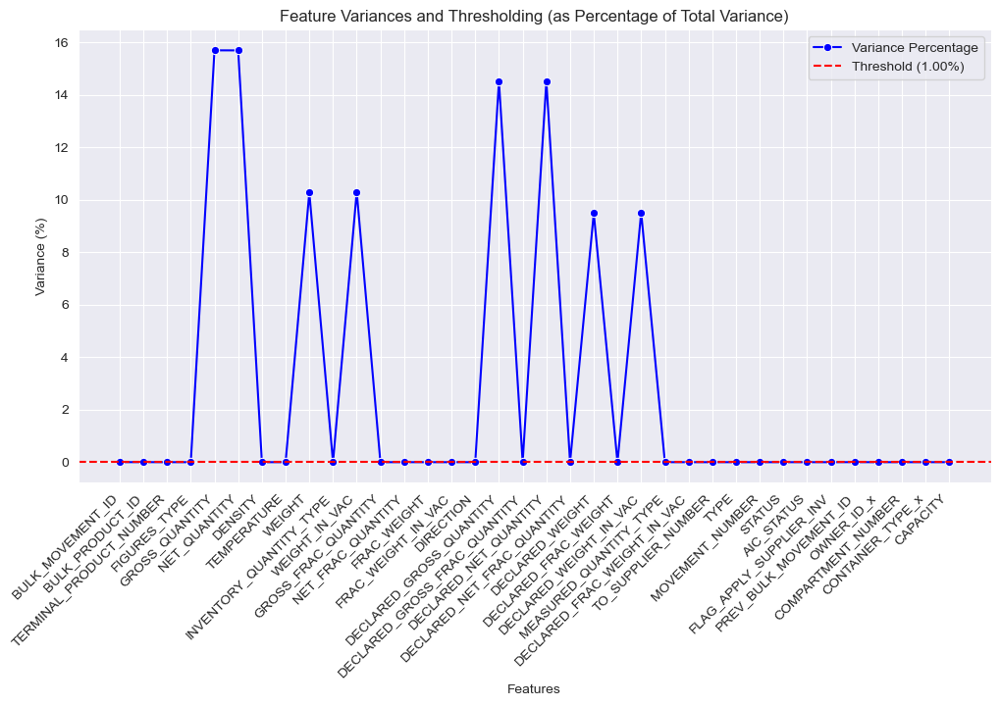

Columns that can be dropped based on variance threshold: Index(['OWNER_ID_x', 'COMPARTMENT_NUMBER', 'CONTAINER_TYPE_x', 'CAPACITY'], dtype='object')


In [100]:
threshold_value = 0.01
selector = VarianceThreshold(threshold=threshold_value)
selector.fit(X_univariate_tb)

feature_variances = selector.variances_

total_variance = sum(feature_variances)
feature_variances_percentage = (feature_variances / total_variance) * 100
# Create a line plot for the feature variances using Seaborn
plt.figure(figsize=(12, 6))
sns.lineplot(x=X_univariate_tb.columns, y=feature_variances_percentage, marker='o', color='blue', label='Variance Percentage', linestyle='-')

plt.axhline(y=threshold_value / total_variance * 100, color='red', linestyle='--', label=f'Threshold ({threshold_value * 100:.2f}%)')
plt.xlabel('Features')
plt.ylabel('Variance (%)')
plt.title('Feature Variances and Thresholding (as Percentage of Total Variance)')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.grid(True)
plt.show()

# Identify columns to drop based on variance threshold
columns_to_drop_variance = X_univariate_tb.columns[~selector.get_support()]
print("Columns that can be dropped based on variance threshold:", columns_to_drop_variance)

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Bivariate Analysis</p>

<div style="background-color:#DBEDF3;padding:20px; font-size:15px">
    
📌 **Bivariate analysis** refers to the statistical analysis or examination of the relationship between two variables. It involves studying how changes in one variable are associated with changes in another variable. The primary goal of bivariate analysis is to understand the correlation, association, or interaction between two distinct sets of data or measurements.

 ### <p style="background-color: #3498db; padding: 8px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.5em; text-align: center; font-weight: 600;">Correlation </p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌 **Correlation** is a bivariate analysis technique. It detects linear relationships between two variables. Think of correlation as a measure of proportionality, which simply measures how the increase or decrease of a variable affects the other variable.

#### <p style="background-color: #3498db; padding: 5px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 1.3em; text-align: center; font-weight: 600;">Finding correlation between variables </p>

We use the correlation Heatmap to find correlation between variables.

In [101]:
X_bivariate_tb = tb_numerical

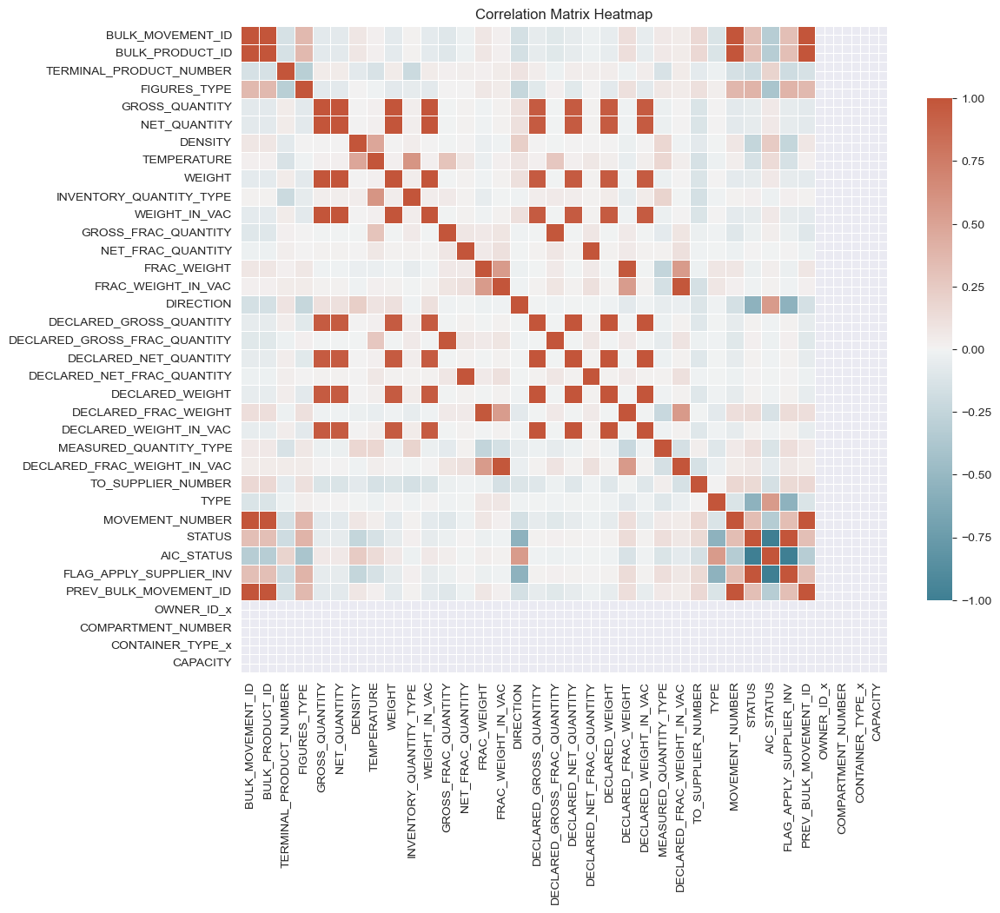

In [102]:
corr = X_bivariate_tb.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 10))

# Create a custom diverging colormap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .75})

plt.title('Correlation Matrix Heatmap')
plt.show()

We will now examine the relationship between two variables at the time and we will focus especially on the target variable.

Firstly, we will user scatter plots to plot the relation between "GROSS_QUANTITY" and the rest of the features.

In [103]:
data_without_gross_quantity = X_univariate_tb.drop('GROSS_QUANTITY', axis=1)

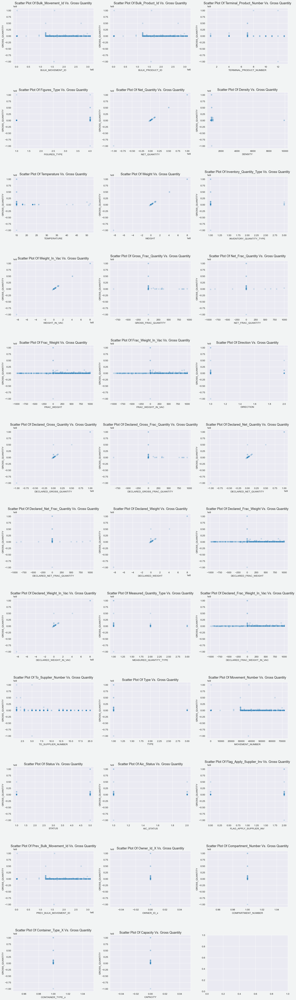

In [104]:
num_rows = (len(numerical_features) + 2) // 3
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 6), facecolor='#F2F4F4')
fig.subplots_adjust(wspace=0.2, hspace=0.5)

axes = axes.flatten()

for i, feature in enumerate(data_without_gross_quantity):
    s = sns.scatterplot(x=feature, y='GROSS_QUANTITY', data=tb, ax=axes[i], alpha=0.2)
    s.set_title(('Scatter Plot of ' + feature + ' vs. Gross Quantity').title(), fontsize=13)


plt.show()

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Multivariate Analysis</p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌 **Multivariate analysis** involves the simultaneous examination and analysis of relationships among multiple variables. Unlike bivariate analysis, which focuses on the relationship between two variables, multivariate analysis considers three or more variables to understand complex patterns and interactions among them.
    
Also referred to as Wrapper methods, multivariate selection techniques take a group of features at a time and test the group’s competence in predicting the target variable.

In [106]:
X_multivariate_tb = tb_numerical

We will explore the relationships between numerical features using a pair plot.

C:\Users\hamdi\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


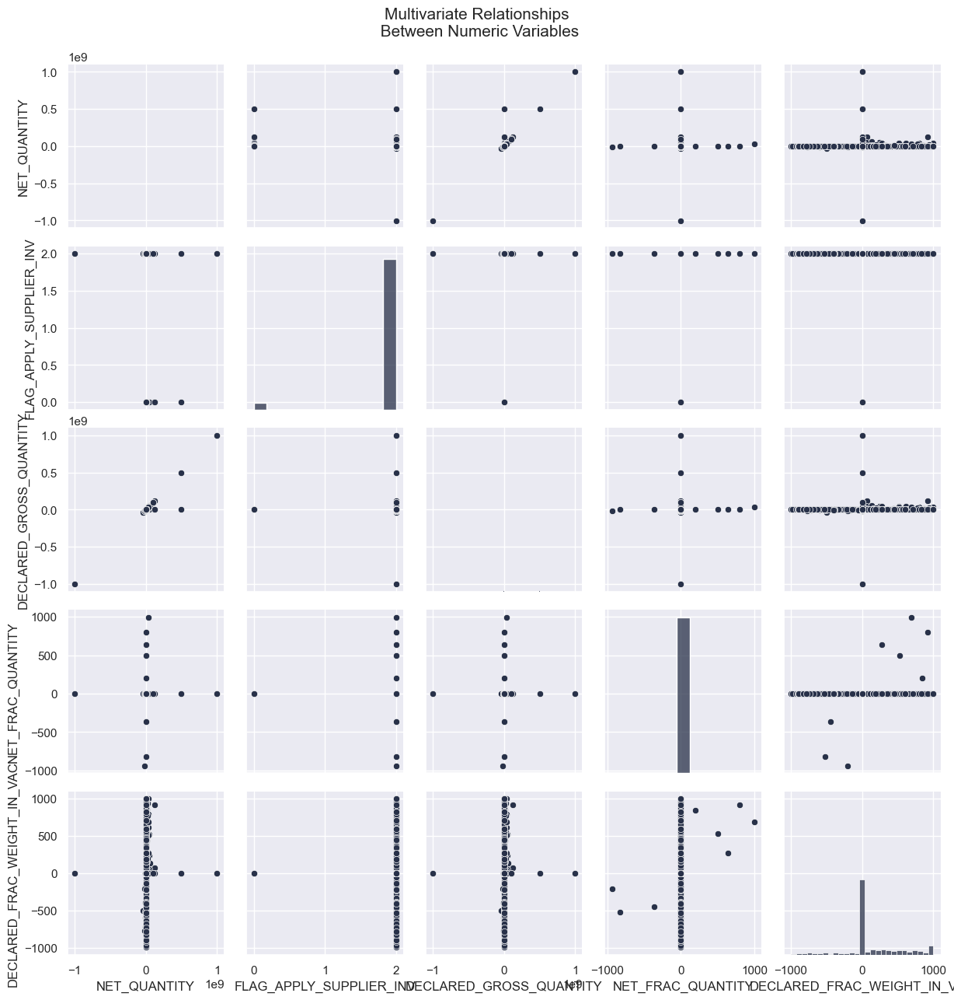

In [107]:
selected_features = X_multivariate_tb.sample(5, axis=1)

colors = ["#283149", "#404B69", "#DBEDF3"]
sns.set(style='darkgrid', palette=colors)

sns.pairplot(selected_features)
plt.suptitle('Multivariate Relationships\n Between Numeric Variables', y=1.03, fontsize=15)
plt.show()

# <p style="background-color: #3498db; padding: 20px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2.5em; text-align: center; font-weight: 600;">Feature Selection</p>

<a id="1"></a>  
## <p style="background-color: #3498db; padding: 10px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2em; text-align: center; font-weight: 600;">Column Dropping</p>

We will exclude the columns suggested by variance thresholding: OWNER_ID_x, COMPARTMENT_NUMBER, CONTAINER_TYPE_x, CAPACITY.

In [108]:
tb = tb.drop(columns_to_drop_variance, axis=1)

We will also exclude features having informations about fractions

In [109]:
tb = tb.drop(['GROSS_FRAC_QUANTITY','NET_FRAC_QUANTITY','FRAC_WEIGHT_IN_VAC','DECLARED_GROSS_FRAC_QUANTITY','DECLARED_NET_FRAC_QUANTITY','DECLARED_FRAC_WEIGHT','DECLARED_FRAC_WEIGHT_IN_VAC'], axis=1)

We will also exclude datetime features keeping only START_TIME because they all point to same date. Only the timestamp value is different by seconds or minutes and we don't think that's necessary for our modeling later.

In [110]:
tb = tb.drop(['HOST_PROCESSED','STATUS_DATE','MOVEMENT_DATE','FOLIO_NUMBER','END_DATE','LAST_MODIFIED_x'], axis=1)

The PREV_BULK_MOVEMENT_ID feature is showing the same values as BULK_MOVEMENT_ID so we drop it.

In [111]:
tb = tb.drop(['PREV_BULK_MOVEMENT_ID'], axis=1)

We drop DAY column which we used for plotting earlier.

In [115]:
tb = tb.drop(['DAY'], axis=1)

In [117]:
tb.shape

(763, 28)

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px"> 
    
- After all column dropping, we got a new shape of our dataset with 28 columns down from 46. 

# <p style="background-color: #3498db; padding: 20px; border-radius: 10px; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);color: #ffffff; font-family: 'Arial', sans-serif; font-size: 2.5em; text-align: center; font-weight: 600;">Feature Engineering</p>